# Laboratorio de Habla 2
## Herramientas Básicas de Procesamiento Digital de Audio

### Objetivos de Aprendizaje
1. Ser capaz de generar y manipular señales en Julia.
2. Ser capaz de realizar distintos análisis de la señal de voz en Julia.
3. Ser capaz de generar diferentes tipos de espectrogramas en Julia.

### Consejos para la Solución
1. Utiliza las convenciones de Julia para escribir código. Puedes encontrarlas en: [Guía de Estilo de Julia](https://web.mit.edu/julia_v0.6.2/julia/share/doc/julia/html/en/manual/style-guide.html)
2. Si copias el texto de los enunciados como parte (comentada) de un fichero de Julia podrás ejecutarlo y obtener un fichero que entregar.
3. Crea una historia que haga amena la lectura del entregable.
4. Recuerda que en la puntuación de entregables cuenta tanto el contenido como la presentación.
5. Esta práctica se puede hacer con Julia básico o usando paquetes de procesado de señal.

### Ejercicio 1: Creación y Manipulación Básicas de Señales
#### Objetivo
Familiarizarse y profundizar en algunos de los apartados de 4.1 Introducción al Procesado de Audio.


#### Actividades
1. Genere una onda sinusoidal de duración 1s., amplitud 𝐴 = 1 y frecuencia de muestreo 𝑓 = 1000𝐻𝑧. Varíe la frecuencia fundamental del tono 𝑓 = [100, 200, 300]𝐻𝑧 y reproduzca los comandos usando una primitiva adecuada en Julia.

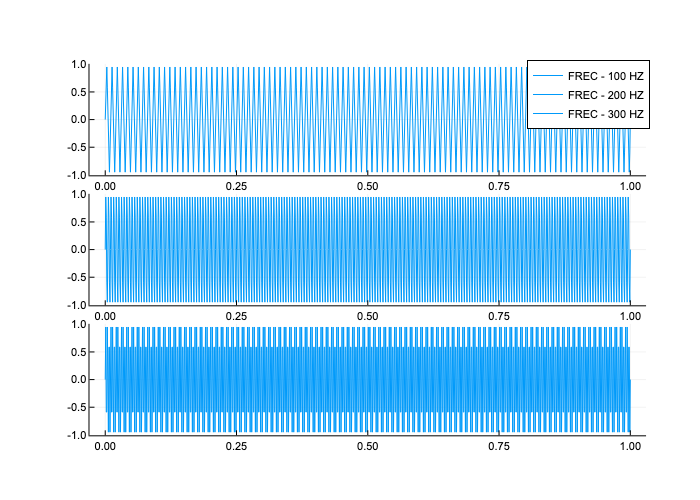

In [2]:
using Plots
using WAV
using Sound
using Plots

amplitud = 1.0      # Amplitud de la onda
fase = 0.0          # Fase inicial de la onda
duracion = 1.0      # Duración de la señal en segundos
fs = 1000           # Número de puntos de fs por segundo

# Crear vector de tiempo
t = 0:1/fs:duracion

# Frecuencias a variar
frecs = [100, 200, 300]

# Crear un plot con subplots
p = plot(layout=(length(frecs), 1))

# Loop a través de cada frecuencia y graficar la onda correspondiente
for (i, f0) in enumerate(frecs)
    y_loop = amplitud * sin.(2π * f0 * t)
    plot!(p, t, y_loop, label="FREC - $f0 HZ", subplot=i)
end

# Mostrar el gráfico final
display(p)


2. Represente la onda sinusoidal del punto 1 para f0 = [5, 10] Hz, compruebe gráficamente el valor del periodo (T0). Represente también el módulo de la FFT y compruebe el valor de f0.


In [3]:
fs = 1000          # Número de puntos de fs por segundo

# Crear vector de tiempo
t = 0:1/fs:duracion

# Frecuencias a variar
frecs = [5, 10]

# Crear un plot con subplots
pp = plot(layout=(length(frecs), 1))

signals = []

# Loop a través de cada frecuencia y graficar la onda correspondiente
for (i, f0) in enumerate(frecs)
    y_loop = amplitud * sin.(2π * f0 * t)
    push!(signals, y_loop)
    period = (1/f0)
    plot!(pp, t, y_loop, label="Frecuency $f0 HZ", subplot=i)
    scatter!(pp, [period:period:maximum(t)], [0.0], markercolor=:red, markersize=5, label="Period $(1/f0) Hz", subplot=i)
end

# Mostrar el gráfico final
display(pp)

Hemos marcado en puntos rojos, el periodo de la señal, repetido T, 2T, 3T... hasta máximo t.
Ahora procedemos a representar el módulo de la FFT

-0.4995004995004995:0.000999000999000999:0.4995004995004995-0.4995004995004995:0.000999000999000999:0.4995004995004995

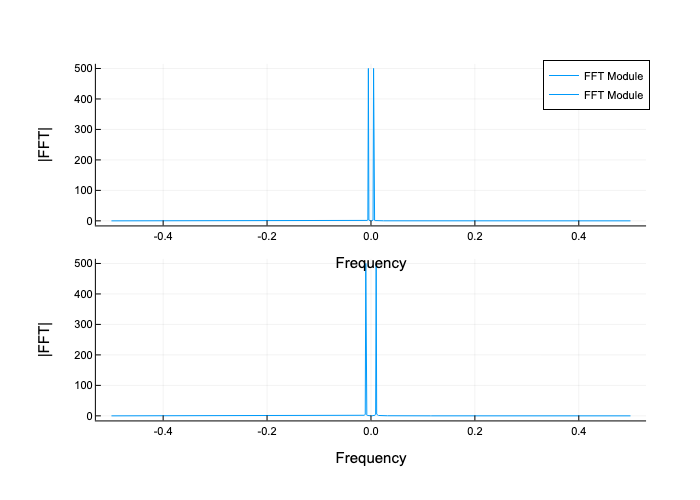

In [4]:
using FFTW
plotlyjs()

p2 = plot(layout=(length(signals), 1))

for (i, signal) in enumerate(signals)

  y_fft = fftshift(fft(signal))
  y_fft_modulo = abs.(y_fft)
  n = length(signal)
  frequencies = fftshift(fftfreq(n))
  print(frequencies)
  plot!(p2, frequencies, y_fft_modulo, xlabel="Frequency", ylabel="|FFT|", label="FFT Module", legend=:topright, subplot=i, hover=frequencies)
end

display(p2)


3. Represente el módulo de la FFT de la señal ejemploEj3T4.mat que fue muestreada a fs = 11000 Hz, identifique f0 y y las frecuencias formantes.


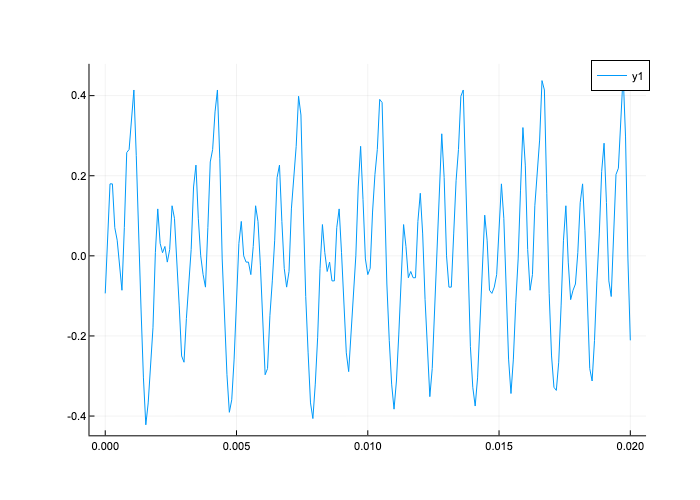

In [5]:
# 3333
using MAT
using FFTW
using Sound

# reading var from matlab example
datos_matlab = matread("/Users/universidad/Desktop/Universidad/CURSO-2023:2024/pdi/PRACTICAS/BLOQUE2-TEMA4/S2/LabHabla2Datos/ejemploEj3T4.mat")
trama3 = datos_matlab["trama3"]

fs_trama3 = 11000
duracion_nueva = (length(trama3)-1)*(1/fs_trama3)
t_trama3 = 0:1/fs_trama3:duracion_nueva

plot(t_trama3, trama3)


-1294.1176470588236

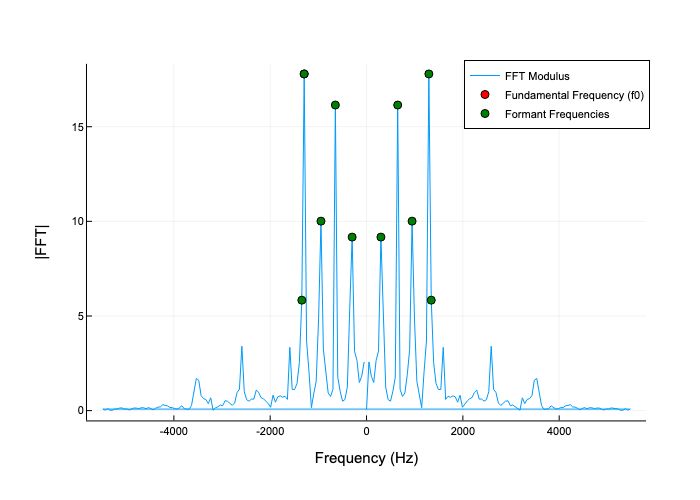

┌ Warning: libportaudio: Output underflowed
└ @ PortAudio /Users/universidad/.julia/packages/PortAudio/HNBv4/src/PortAudio.jl:99


221

In [6]:
# TEST

using MAT
using Plots
using FFTW

# Extraer la señal y la frecuencia de muestreo
signal = datos_matlab["trama3"]
fs = 11000

# Calcular la FFT de la señal
N = length(signal)
frequencies = fftfreq(N, fs)
fft_result = fft(signal)

# Calcular el módulo de la FFT
fft_modulo = abs.(fft_result)

# Encontrar la frecuencia fundamental (f0)
f0_index = argmax(fft_modulo[2:end]) + 1
f0 = frequencies[f0_index]
print(f0)

# Encontrar las frecuencias formantes (por ejemplo, las primeras tres)
num_formants = 10
formants_indices = sortperm(fft_modulo[2:end], rev=true)[1:num_formants]
formants_frequencies = frequencies[formants_indices .+ 1]

p3 = plot(layout=(1, 1))

# Crear el gráfico
plot!(p3, frequencies, fft_modulo, xlabel="Frequency (Hz)", ylabel="|FFT|", label="FFT Modulus")
scatter!([f0], [maximum(fft_modulo)], color=:red, label="Fundamental Frequency (f0)")
scatter!(frequencies[formants_indices .+ 1], fft_modulo[formants_indices .+ 1], color=:green, label="Formant Frequencies")

# Muestra el gráfico
display(p3)

sound(signal, fs)

4. Represente en el dominio temporal y en el dominio espectral los fragmentos de una señal de voz contenidos en ejemploEj4AT4.mat y ejemploEj4BT4.mat. Identifique qué fragmento es sonoro y qué fragmento es sordo (fs = 11000 Hz).

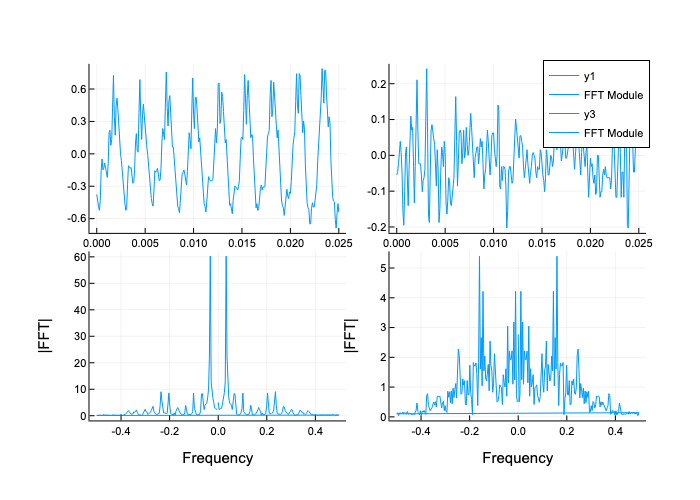

In [7]:
using MAT
using Plots
using FFTW

# reading var from matlab example
ejemploEj4AT4 = matread("/Users/universidad/Desktop/Universidad/CURSO-2023:2024/pdi/PRACTICAS/BLOQUE2-TEMA4/S2/LabHabla2Datos/ejemploEj4AT4.mat")
ejemploEj4BT4 = matread("/Users/universidad/Desktop/Universidad/CURSO-2023:2024/pdi/PRACTICAS/BLOQUE2-TEMA4/S2/LabHabla2Datos/ejemploEj4BT4.mat")
trama1 = ejemploEj4AT4["trama1"]
trama2 = ejemploEj4BT4["trama2"]

tramas = []

push!(tramas, trama1)
push!(tramas, trama2)

fs = 11000
duracion_trama1 = (length(trama1)-1)*(1/fs)
duracion_trama2 = (length(trama2)-1)*(1/fs)

t_trama1 = 0:1/fs:duracion_trama1
t_trama2 = 0:1/fs:duracion_trama2

plot_e4 = plot(layout=(2, 2))

for (i, trama) in enumerate(tramas)
  plot!(plot_e4, t_trama1, trama, subplot=i)
  y_fft = fft(trama)
  y_fft_modulo = abs.(y_fft)
  n = length(trama)
  frequencies = fftfreq(n)
  plot!(plot_e4, frequencies, y_fft_modulo, xlabel="Frequency", ylabel="|FFT|", label="FFT Module", legend=:topright, subplot=i+2, hover=frequencies)
end

display(plot_e4)


¿Cual es fragmento sordo? ¿Cual es sonoro?
#TODO

### Ejercicio 2: Extracción de Características de la Señal de Voz
#### Objetivo
Familiarizarse con los conceptos básicos del apartado 4.2. Procesamiento Digital del Sonido

#### Actividades
1. **Visualización**


   a. Lea el fichero de audio confront.wav y reprodúzcalo. ¿Cuál es la frecuencia de muestreo original?


In [8]:
using Plots

confront, fs = wavread("/Users/universidad/Desktop/Universidad/CURSO-2023:2024/pdi/PRACTICAS/BLOQUE2-TEMA4/S2/LabHabla2Datos/confront.wav")

# sound confront wav
sound(confront, fs)

# original sampling rate
println("Original sampling rate: $(Int(fs))") # 16000 HZ

Original sampling rate: 11025


   b. Haga lo mismo al doble y a la mitad de la frecuencia de muestreo.
   

In [9]:
using Plots
plotlyjs()
# sound confront wav
sound(confront, fs*2)

sound(confront, fs/2)

19778

c. Visualice la señal de voz.


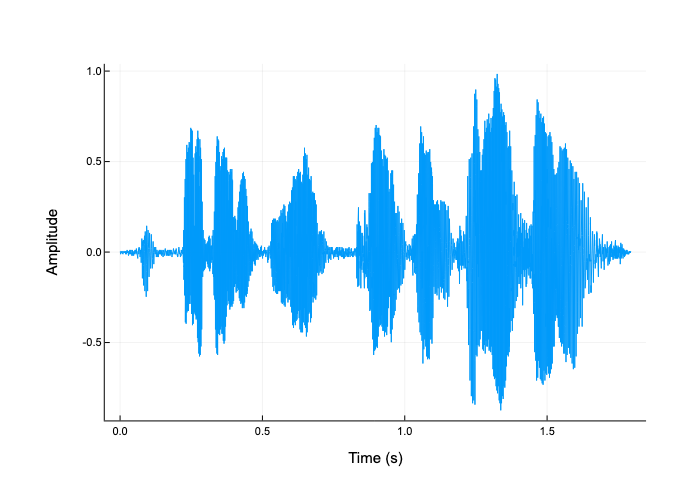

In [10]:
using Plots
using WAV
using Sound
plotlyjs()

d = (length(confront)-1)*(1/fs)
t = 0:1/fs:d

plot(t, confront, xlabel="Time (s)", ylabel="Amplitude", legend=false)

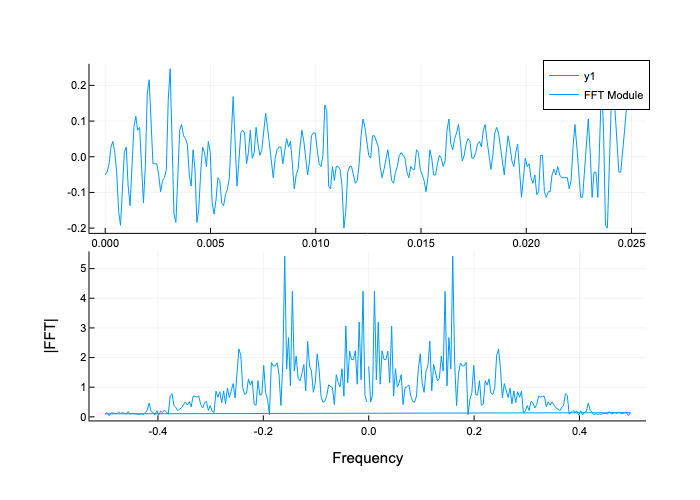

In [11]:
# representar en el dominio de la frecuencia también
using MAT
using Plots
using FFTW

# confront, fs

trama = confront[9200:9475]

duracion = (length(trama)-1)*(1/fs)

t = 0:1/fs:duracion

p = plot(layout=(2, 1))

p1 = plot(t, trama)
y_fft = fft(trama)
y_fft_modulo = abs.(y_fft)
n = length(trama)
frequencies = fftfreq(n)
p2 = plot(frequencies, y_fft_modulo, xlabel="Frequency", ylabel="|FFT|", label="FFT Module", legend=:topright, hover=frequencies)

plot(p1, p2, layout=(2,1))


2. **Enventanado: localización del análisis**
   

a. Obtenga y represente en el tiempo las ventanas rectangular y de Hamming de una duración de 20ms.
   

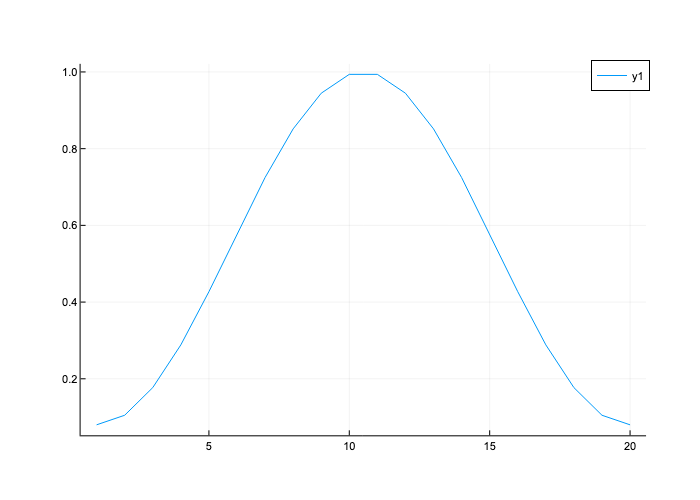

In [12]:
using Plots
using DSP

N = 20
h_window = DSP.hamming(N)

plot(1:N, h_window)

b. Observe sus perfiles. ¿Qué ventana introduce menos distorsión en el dominio temporal?
   

22

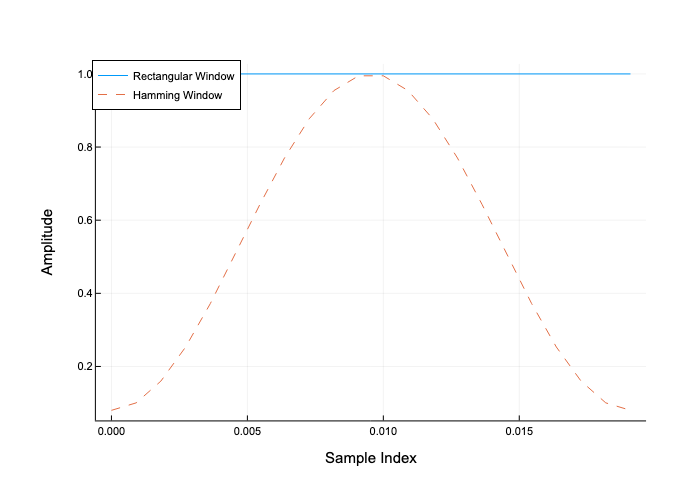

In [13]:
# comparamos diferentes ventanas, como por ejemplo, con una rectangular

using Plots, DSP
plotlyjs()

L = 64
fs = 1100

T = 20/1000;
N = Int(round(T*fs))
print(N)

h_window = DSP.hamming(N)
rectangular_window = ones(N)

t = (0:N-1)/fs

plot(t, rectangular_window, label="Rectangular Window", xlabel="Sample Index", ylabel="Amplitude", legend=:topleft)
plot!(t, h_window, label="Hamming Window", linestyle=:dash)

En el dominio temporal, la ventana que provoca menos distorsión en el tiempo es la rectangular, ya que está multiplicando la señal en el tramo por 1

c. Calcule el espectro de frecuencia de dichas ventanas, usando la FFT y compare los módulos de los espectros de ambas ventanas representándolos lado a lado.
   

In [14]:
using Plots, DSP
plotlyjs()
include("functions.jl")

L = 64
fs = 1100

T = 20/1000;
N = Int(round(T*fs))
print(N)

h_window = DSP.hamming(N)
rectangular_window = ones(N)

espectro_ventanas(rectangular_window, h_window)


22

BoundsError: BoundsError: attempt to access Tuple{Int64} at index [256]

d. Varíe la longitud de las ventanas (p.ej. a 10ms y 30 ms) y observe el efecto de los espectros de las ventanas (anchura del lóbulo principal y nivel de los lóbulos secundarios).


In [15]:
# no se como hacerlo


3. **Energía localizada y tasa de cruces por cero**


   a. Seleccione el segmento de la señal entre las muestras 15500-19500. Obtenga la evolución de la energía con el tiempo utilizando ventanas Hamming de diferente longitud, mediante una función `energia(s,h)` en donde `h` es la ventana de Hamming y `s` es el segmento de la señal que se considera.
   


220

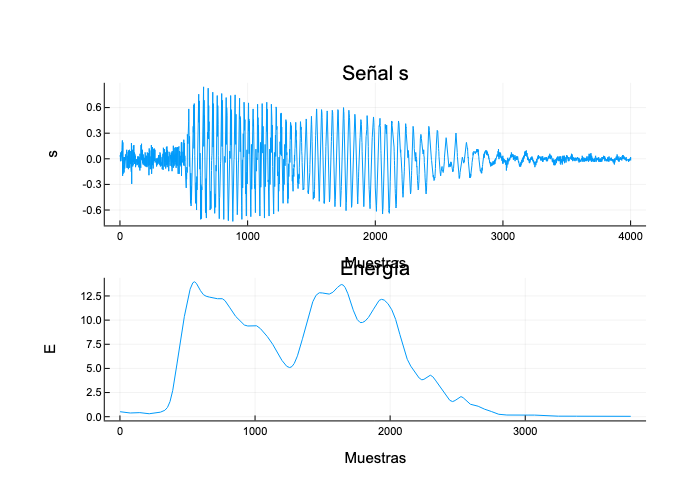

In [16]:
using Plots
include("functions.jl")

confront, fs = wavread("/Users/universidad/Desktop/Universidad/CURSO-2023:2024/pdi/PRACTICAS/BLOQUE2-TEMA4/S2/LabHabla2Datos/confront.wav")

segmento = confront[15500:19500]
# calculamos la ventana de hamming para esta frecuencia de muestreo
T = 20/1000;    # 20 milisegundos
N = Int(round(T*fs))
h_window = DSP.hamming(N)
print(N)

energia(segmento, h_window)

   b. Observe el efecto del tamaño de la ventana. ¿Qué ocurre si el tamaño de la ventana es muy pequeño o si es muy grande?


2200

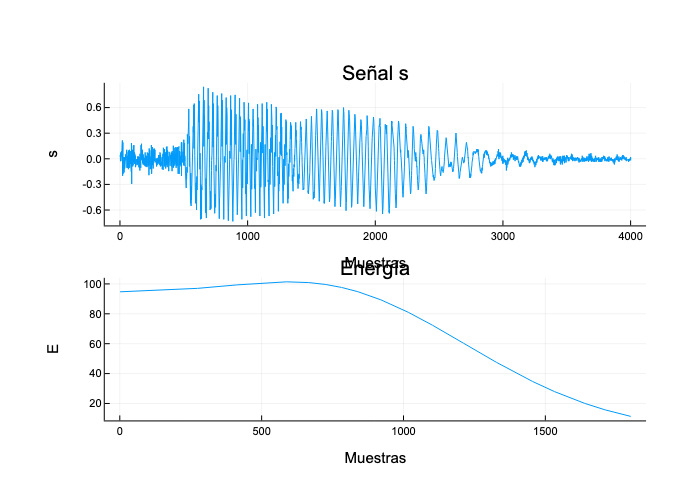

In [17]:
# Aumentamos el tamaño de ventana

h_window = DSP.hamming(N*10)
print(length(h_window))

energia(segmento, h_window)

22

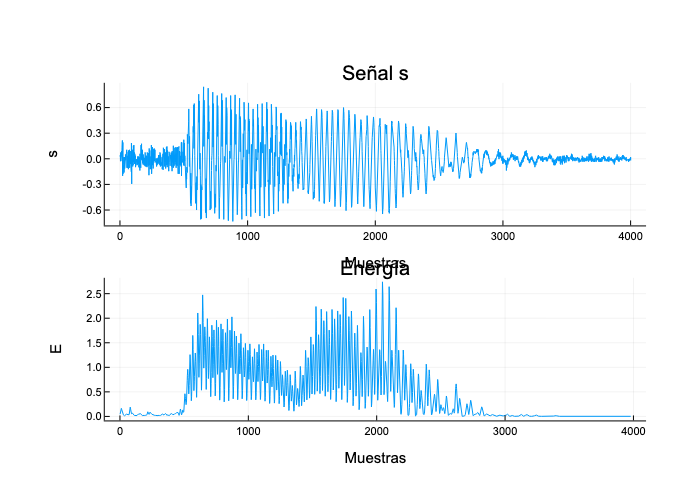

In [18]:
# Disminuimos el tamaño de ventana
# N = 220
h_window = DSP.hamming(22)
print(length(h_window))

energia(segmento, h_window)

Lo que ocurre, es que si tenemos una ventana muy grande, es poco precisa a la hora de sacar información, sin embargo al contrario, es demasiado precisa y nos da demasiada información. Lo suyo es ajustar la ventana a las necesidades de análisis de la señal.

   c. La función `zcr.m` estima la tasa de cruces por cero. Tradúzcala a Julia como `zcr(s,L)` en donde `s` es la señal y `L` la longitud de ventana usada para el cálculo.


In [19]:
cruces = zcr(confront, 100)


19679-element Vector{Float64}:
 0.07
 0.07
 0.07
 0.07
 0.07
 0.07
 0.07
 0.07
 0.07
 0.07
 ⋮
 0.21000000000000002
 0.2
 0.19
 0.19
 0.18000000000000002
 0.17
 0.17
 0.17
 0.0

   d. Use las funciones `energía` y `tasa de cruces por cero` para determinar qué partes de la señal son sonoras y cuáles son sordas creando una función `vozSS(s,h)` que tome una señal y una ventana y devuelva la energía y la tasa de cruces por cero, además de pintar la evolución de la energía y de la tasa de cruces por cero.


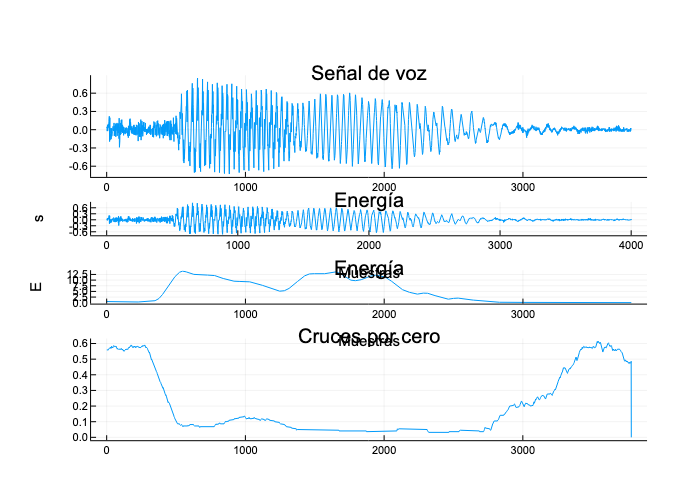

In [20]:
include("functions.jl")
# hacemos la funcion vozSS(s,h)

# señal, ventana - nos devuelve la energia y la tasa de cruces por 0
h_window = DSP.hamming(N)

vozSS(segmento, h_window)


4. **Estimación del "pitch": autocorrelación y espectro**


   a. Obtenga dos tramas de la señal original (sig), trama 1: muestras 14200-14475 y trama 2: muestras 9200:9475.


In [21]:
segmento1 = confront[14200:14475]
segmento2 = confront[9200:9475]

276-element Vector{Float64}:
 -0.050980392156862786
 -0.04313725490196074
 -0.019607843137254943
  0.027450980392156765
  0.04313725490196085
  0.0117647058823529
 -0.04313725490196074
 -0.15294117647058825
 -0.19215686274509802
 -0.0980392156862745
  ⋮
  0.12941176470588234
  0.03529411764705892
 -0.04313725490196074
 -0.04313725490196074
  0.027450980392156765
  0.07450980392156858
  0.13725490196078427
  0.19215686274509802
  0.1843137254901961

   b. Encuentre o cree una función para hallar la autocorrelación entre dos señales `[c,k] = xcorr(trama)`. En c se almacenarán los valores de la autocorrelación y en k los valores de los desplazamientos. Determine si se trata de tramas sonoras o sordas. En el caso de que alguna de las tramas sea sonora, estime el pitch o frecuencia fundamental.


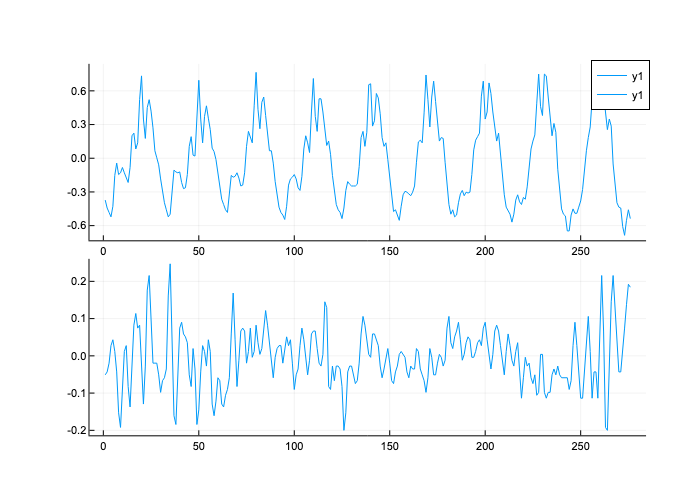

In [30]:
# hallamos la funcion
# [c,k] = xcorr(trama)
using DSP
include("functions.jl")

p =plot(segmento1)
p2 =plot(segmento2)

plot(p, p2, layout=(2,1))

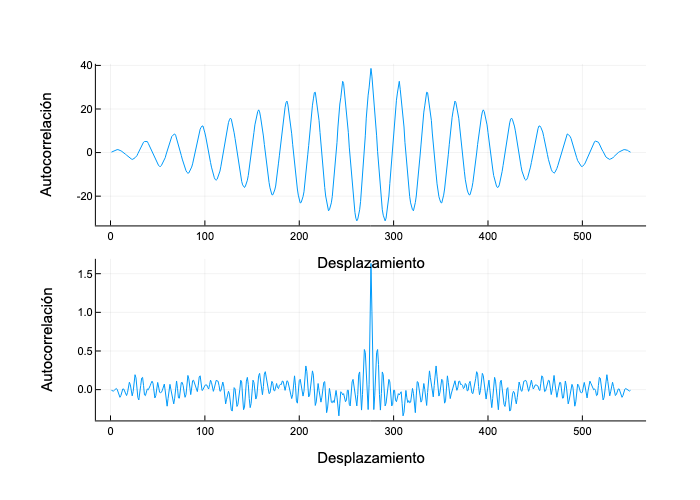

In [23]:
# hallamos la funcion
# [c,k] = xcorr(trama)
using DSP
include("functions.jl")

autocorrelacion = xcorr(segmento1, segmento1)
autocorrelacion2 = xcorr(segmento2, segmento2)

# Visualizar los resultados
P1 = plot(autocorrelacion, xlabel="Desplazamiento", ylabel="Autocorrelación", legend=false)
P2 = plot(autocorrelacion2, xlabel="Desplazamiento", ylabel="Autocorrelación", legend=false)

plot(P1, P2, layout=(2,1))
# autocorrelacion_entre_senales(segmento1, segmento2)
# ESTO NO FUNCIONA


Las tramas sordas tienden a tener una variación de las frecuencias muy similar, como se ve en la primera trama.
Sin embargo, los tramos sonoros tienen una componente de frecuencia fundamental más prominente, como se puede apreciar en el segundo gráfico.
Estimamos el pitch de la segunda trama

Tono estimado de segmento2: 39.945652 Hz


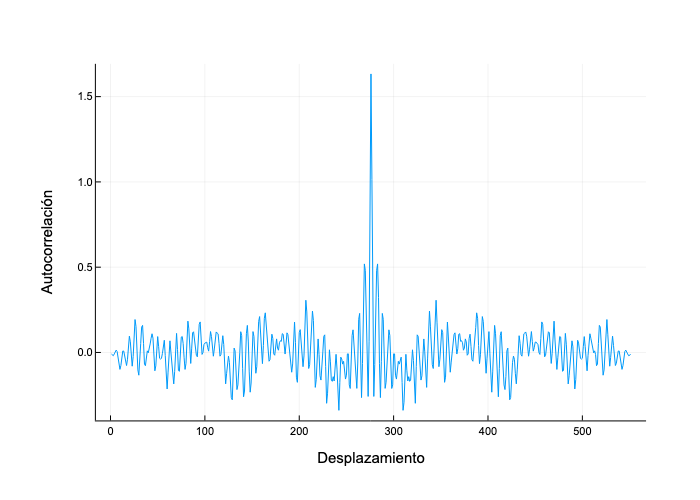

In [24]:
# pitch segmento2
using DSP
include("functions.jl")

confront, fs = wavread("/Users/universidad/Desktop/Universidad/CURSO-2023:2024/pdi/PRACTICAS/BLOQUE2-TEMA4/S2/LabHabla2Datos/confront.wav")

segmento2 = confront[9200:9475]

autocorrelation = xcorr(segmento2, segmento2)


# Display the estimated pitch
println("Tono estimado de segmento2: ", estimar_pitch(autocorrelation, fs), " Hz")


# Plot the autocorrelation
plot(autocorrelation, xlabel="Desplazamiento", ylabel="Autocorrelación", legend=false)




   c. Obtenga el espectro de frecuencia de ambas tramas con una función `spectrum(trama, fs)` en donde fs es la frecuencia de muestreo y use los espectros para saber si se trata de tramas sonoras o sordas. En el caso en que alguna de las tramas sea sonora, estime su "pitch" o frecuencia fundamental.


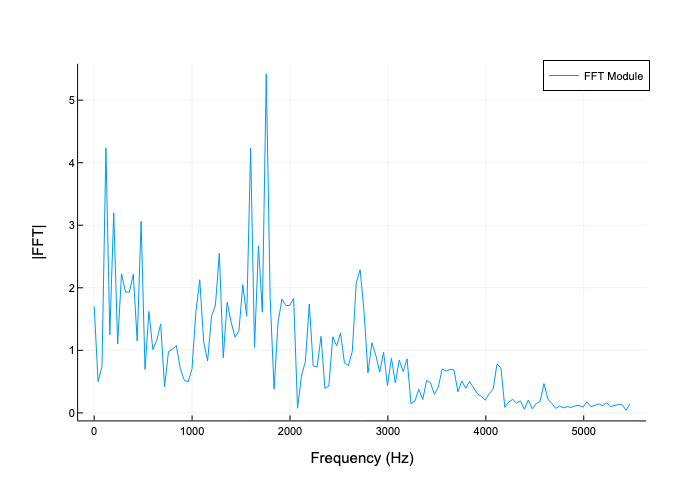

In [25]:
# function from functions.jl - spectrum(trama,fs)
include("functions.jl")

spectrum(segmento2, fs)

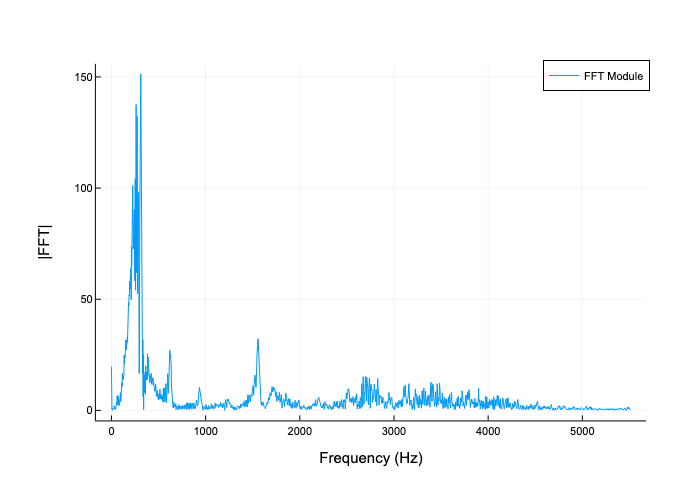

In [26]:
# ahora el segmento 1
include("functions.jl")

spectrum(segmento, fs)

   d. Compare y comente las estimaciones obtenidas por ambos métodos.


La estimación del pitch a través de la correlación es util con la autocorrelación para sonidos sonoros (trama 2) donde sacamos la diferencia entre los picos. Sin embargo de la otra forma, sería para estimar analisis del pitch o frecuencia central y también de las frecuencias formantes


5. **Espectrogramas**


   a. Obtenga un espectrograma de banda ancha (longitud de ventana N=128 muestras) y otro de banda estrecha (N=1024 muestras) para la señal de audio. Para ello, cree una función `spectrogram(s, N, fs)`.


DSP.Periodograms.Spectrogram{Float64, Frequencies{Float32}, Matrix{Float64

}}([1.743616804717578e-10 3.5308240295530962e-9 2.724401257371216e-8 6.974467218870312e-10 1.573614166257619e-8 1.1337868272676064e-7 2.7244012573712223e-8 7.68935010880455e-8 5.274440834270619e-9 4.7469967508436636e-8 7.366780999932009e-9 1.1786849599891072e-7 2.1097763337083047e-8 1.7436168047175806e-8 4.162056903281008e-6 3.2239474719228223e-7 1.2156932266692228e-6 4.3590420117946855e-11 4.714739839956375e-7 6.70246299733443e-7 2.5108081987933895e-8 2.7897868875483026e-9 2.2597273789139956e-7 5.039052565633818e-8 4.189039373334024e-8 2.7897868875481417e-7 4.359042011792835e-11 4.359042011793896e-9 6.974467218870332e-8 7.366780999931832e-9 2.322933488084998e-7 1.1337868272676078e-7 3.6659543319187083e-8 1.366995574898589e-7 4.1890393733340356e-8 6.630102899938644e-8 1.7854636080308062e-7 2.8599674639380234e-7 5.178977814212428e-7 1.1020094110016351e-6 1.3197435594907444e-6 3.149407853521148e-7 1.2597631414084649e-8 2.0906401392765105e-6 6.294456665030475e-8 1.6745695792507737e-6 1.17

 7.056781151195244e-6 2.1031390867796117e-7 4.170860930496931e-7 8.440353556176236e-7 1.2687688189140416e-7 2.0478791057414144e-7 6.015697942881503e-7 3.1738347497518495e-6 8.111573016886933e-7 2.6105796866444026e-6 9.068043010699906e-7 2.04767016558081e-5 2.1543944705216433e-6 2.1756999690393678e-5 2.6943618736800225e-5 3.1292825476471282e-6 2.8052253939917835e-5 8.973446100964186e-6 1.1773407493870638e-5 3.0946575195767955e-6 2.878489056330309e-7 4.3982280230803854e-7 6.104224409123222e-8 2.0808139451150463e-6 6.463243045002504e-7 2.532142843201867e-5 3.4742929589417088e-6 2.1881575561051875e-5 6.668696963250216e-7 4.166415009000012e-6 6.137242016459282e-7 1.6353175751515132e-6 1.3283429064837427e-6 2.3854719391815985e-7 1.7049873931465304e-6 6.972799438380491e-6 1.5150291635368157e-6 9.811867055607958e-6 1.6971957610011457e-5 3.855050967820789e-5 3.751136336731984e-5 0.000180942111495829 1.3905035016571733e-5 1.4174298321353636e-5 1.6055934353937248e-6 1.091326137790951e-5 5.7879145

 3.389032687964453e-5 2.44476963969831e-5 2.5341738824388103e-5 1.673655884403291e-5 1.1569103035655334e-5 7.621154836006802e-6 1.4133003712807436e-5 1.331638791936016e-5 2.0704580856798183e-6 5.090253127118135e-8 1.6370312448538996e-6 3.2279070532732615e-7 9.174305854356658e-7 8.86293552554359e-7 7.572406019094721e-7 4.0780969417737103e-7 3.5986397096423647e-7 7.456829657931586e-7 1.0063526077842413e-6 4.784757292407414e-7 6.828033555807554e-8 4.79128407166197e-8 3.3147313798373455e-8 1.279530153706446e-7; 7.695026555157089e-9 3.2578070710868536e-9 2.5969086909694407e-8 3.7993192391263944e-10 1.2436049388318084e-9 1.468429731809617e-8 6.36310950396883e-9 1.590587318178433e-8 1.1467259753459036e-7 2.5673203100514705e-7 1.2779521275861778e-8 1.9174164103874296e-7 6.067481591046247e-6 1.14719074215357e-5 2.6745658386801738e-5 4.225047830518218e-5 6.681957387780228e-5 4.641839861226478e-5 3.1131515715203476e-5 1.8082331248594168e-5 1.7474275604766223e-6 8.743610274546205e-7 3.984133876895

 9.120249660242791e-7 1.866806828531345e-5 9.316349414748221e-5 0.00022050972072616072 0.00034502263264782335 0.0002506436172417294 0.00014794772387582308 9.879294755103826e-5 7.074341454021721e-5 1.8678660644196886e-5 4.290550543192837e-6 4.254249566773001e-6 1.1098286786119874e-6 2.7086458965083373e-6 1.370971733661205e-5 0.00013531702491080192 0.00015787738833374752 0.0003133704358559142 0.00035685712935879324 0.00031969163879835925 0.0002584225052087359 0.00020515905908767313 6.1025259087313045e-5 4.493991886545901e-5 2.4419127541844752e-5 1.2297174518491693e-5 5.087603224107038e-7 5.320066158443682e-7 2.804683684959762e-7 1.1269843523545326e-6 1.1757937321111084e-6 7.049692686249295e-5 0.00042045050577472245 0.0007275623970059848 0.0004009119393911474 0.0002770603847436916 0.00012430992801674526 0.00017931949122312047 0.00019022322084872643 9.52915874681674e-5 0.00016447085208336006 0.00028722142781995085 0.0003456920073646083 0.00022352989168893065 0.00028170087221232685 0.000305

 2.4179924829532128e-9 7.621823548126947e-9 1.714491264203341e-8 2.2922094688872748e-9 6.605483674732336e-8 5.280179909067329e-10 4.087714861431116e-8 3.185035697366201e-7 2.744166528884034e-6 1.2253508358233165e-5 4.4602175906246306e-5 4.8328582693009914e-5 7.523747017016102e-6 6.111814203683041e-7 3.77186620632075e-8 1.0780670666484549e-7 1.3892494209467534e-7 1.1627057803023523e-7 9.752174888823472e-8 8.488780126770432e-8 8.068318745431058e-8 4.220166130193621e-8 8.040547280347044e-9 4.348307210413209e-8 6.511585501439129e-9 4.895913901946382e-8 7.477190170571537e-8 9.831875595756575e-9 5.99611051837108e-9 1.2326661350254316e-8 1.1124203585665532e-8 3.298920835718532e-8 6.649743950422142e-8 8.880296005218524e-6 1.7149226991346128e-5 4.522504131393744e-6 3.176308013230373e-6 9.444616182034775e-6 2.2579257126490508e-5 8.276994379695805e-5 0.00033915329583334374 0.0007175602479102646 0.0010960040406896502 0.0011386069362188966 0.00039888214822981035 6.610820530489678e-5 1.2025181478534

 2.9661986215692084e-7 2.9756020376058346e-7 6.106190200650548e-7 3.54950005964635e-7 2.3873009694996707e-6 1.719049776451612e-5 3.982366049070118e-5 7.743916216015664e-5 1.7613761525336075e-6 3.385610008530848e-5 1.207216393287667e-5 9.404300994648805e-6 6.451471733534544e-6 9.141921399619017e-6 1.3425765932865215e-5 3.6346827627992582e-6 7.021211108807423e-6 1.1628271431841648e-5 2.5023531009502415e-6 2.4013489151779733e-6 1.0650945913468833e-5 4.63535394258881e-6 1.040232484595244e-6 8.31846999039153e-6 4.536660919505073e-7 2.245755421882529e-6 9.927681771617916e-8 1.67062982950518e-8 2.3822491344754732e-8 9.311499144524483e-8 7.535330103254995e-7 2.3242640638684522e-7 1.5448417972428906e-6 2.1187007652848364e-7 3.252853827789589e-7 2.8417105416686676e-6 9.629017493972663e-6 7.802429789558422e-6 7.69094601996364e-5 0.00024301306076524807 0.0009054644248492908 0.0010234259595938773 0.00029889049201506466 0.0001261104609912165 1.8138565622386193e-5 7.770456389468439e-7 4.2679609861165

 1.894013359978149e-9 2.275042182443512e-6 3.5392163534765864e-5 0.0001370492206901793 0.0001697490249630963 0.0002185054502967633 0.0002474335526816463 7.494291148640876e-5 1.814632011682093e-5 1.1230776031280134e-6 1.9059957562163252e-7 1.9387491418033784e-5 6.069972888276735e-6 7.78310791229047e-6 5.285059537836244e-7 2.287948570184562e-8 3.479841839707532e-7 2.6776387377225495e-7 3.3637636757073874e-7 2.7905073347291153e-6 1.8897927132583197e-6 5.033879252870505e-6 1.1919970557282099e-6 8.081122378859096e-6 3.809392626132322e-6 1.1051818061873594e-5 2.4020481371671286e-6 1.0391705422012837e-5 6.122427131211847e-6 1.884121814400515e-6 5.486776235344428e-6 8.246187786974559e-6 5.797940446446726e-6 3.3239458860651096e-6 6.335587447534259e-6 1.6119068218686995e-5 2.4497081806919487e-5 2.535479710649459e-5 2.306980828288171e-5 1.3165005666103334e-5 8.517018303621043e-6 3.26327813449218e-6 3.2066476317522426e-7 7.751694326688468e-7 4.989032299594427e-7 9.990324578522123e-8 2.213688314789

 6.857123066809495e-8 3.073529973901482e-8 5.5311575713092236e-8 3.840550450407136e-6 2.611494915190534e-7 1.7748222376676555e-5 7.569935191212198e-6 5.227020569604095e-5 3.9594157494130267e-5 2.3252927899747178e-5 1.6923833826955934e-5 5.815403232994925e-6 3.7288221558400777e-6 1.6266789375315617e-7 6.546933930375178e-6 1.3626646206463077e-5 1.6523871727741442e-5 4.360124367664717e-5 4.376114904072278e-5 5.496449838992207e-5 9.537247814452368e-7 9.108463516158672e-6 2.135270001328586e-5 1.210986230924742e-5 3.4459707984238924e-6 5.446339426693011e-8 6.30478662295224e-7 8.886584644080465e-6 2.755183095988262e-6 1.6009538652039338e-6 1.6974592302347994e-6 2.4369697460696577e-6 1.0518582317887654e-6 3.313515393222452e-7 3.244958176843332e-8 2.9262927475115062e-8 4.27690454201762e-8 3.774843915673679e-8 2.9114521112521037e-9 6.078578266069927e-9 1.6437678635350947e-7 9.2050557081677e-9 1.2459401601237077e-7 1.5562937263445033e-6 1.6893705104578976e-6 6.06153734897384e-6 1.124022424414747e

 3.058724987123329e-7

 6.050071457040641e-8 4.1795771919594355e-7 5.020743104760131e-8 7.719731952573808e-8 4.875519732565673e-7 7.419221857240712e-7 1.0844368990559017e-7 3.9025464284273457e-7 2.0166045974032915e-7 1.7571392425634918e-8 1.679917683717008e-8 2.8492318267489815e-8 1.625634132453448e-8 1.8897185768904087e-8 4.931107448794827e-9 5.25613772319726e-9 7.323281332672676e-9 7.287760176186908e-9 3.0412295127738874e-8 1.5040272361780615e-8 1.1886307354921755e-7 4.515009752181771e-8 1.1489185198067357e-7 1.4287506405978798e-6 1.7393554893440566e-6 4.714146804755039e-6 3.866245569865348e-6 9.192858599309959e-6 8.916148126209116e-6 1.8183078227777648e-5 3.422008298473206e-5 4.481346620575793e-5 5.096746207563394e-5 7.752704585361154e-5 8.555438027078207e-5 5.6931688082200187e-5 5.816772599313575e-5 3.8701179584018e-5 3.1824062548833353e-5 1.0680397951417156e-5 1.0726558244994127e-6 4.63173342083331e-7 5.453251230867721e-7 1.0764885910835266e-6 2.6006282931799666e-7 1.623593793423318e-7 2.026461295712713

 5.298667705157923e-8 1.7192185547993837e-8 1.1270575398123864e-8 4.475137176005382e-8 4.005492890693823e-8 7.449816026031111e-8 1.6469178672753663e-7 5.1529872074862067e-8 5.292944996440133e-7 1.0254905920857171e-6 3.2657207843239007e-6 9.038160727103724e-7 1.6840622218302604e-6 2.039599974987712e-6 1.5507580902614677e-6 2.424539146502054e-6 5.141133630584013e-6 7.410058109378351e-7 2.9083092869607905e-6 3.700683158240715e-7 2.023964621750432e-6 9.064892332793343e-7 6.729677787209138e-8 9.184239569211966e-8 1.045269666143312e-6 6.61806404505055e-7 2.6135425391232846e-7 1.984138343986969e-7 3.496341408205656e-7 2.0627451197967684e-6 7.760932594831923e-8 4.50945671619839e-6 1.6543652264015561e-6 5.090280743097478e-6 8.043989500172777e-7 3.2208742732014237e-6 6.821841962316572e-7 3.511781598311106e-8 1.8865657638245554e-8 1.9169792756487185e-7 7.346424581869601e-7 7.139785935529346e-8 5.063841213585845e-8 3.1514339820773946e-8 3.0646198491461215e-7 1.1759818692408716e-7 2.775682114525299

 6.461459711526698e-5 2.8235072925698547e-5 6.501246273315406e-6 2.8454173776423297e-7 1.2648353272339934e-5 5.800970233139091e-6 9.489940289185208e-7 2.1262107492235915e-7 1.581131065049381e-6 1.148997279482507e-6 4.0802919121894156e-7 4.901548291365519e-8 1.5043817469885675e-7 1.6919822058336904e-7 1.5419259274731823e-7 1.383254608472072e-7 1.641638734043676e-7 3.8780894503550024e-8 2.02484931671806e-8 3.9714106571734205e-8 7.458320811819532e-8 1.2481094799582764e-7 1.9906308324925626e-8 6.774787738589984e-9 9.791000777021563e-9 9.917646715513216e-9 4.545205517700641e-8 1.4554044630444616e-8 1.1155549421055424e-8 3.058456667546664e-8 6.834672759692012e-9 7.0000192185135215e-9 1.0426932070630264e-8 3.2970315653829445e-9 8.492536528055957e-10 5.981971066858916e-9 1.8398837460596564e-8 9.793121177010063e-9 5.406539784894686e-9 1.0071415129835123e-7 3.6835824302582995e-6 2.1197203285806574e-6 5.660952124397296e-9 2.05017545666738e-7 2.8502062431160093e-6 1.2880961283862186e-6 4.254710641

 1.1353797301268518e-6 2.5902234232990117e-6 4.935616712608866e-7 2.2933941559661194e-6 1.9702216288600023e-7 8.375110648256013e-8 4.431501724513592e-8 1.334469247015582e-7 5.582116629146524e-7 5.359297905734016e-8 7.373328524203975e-8 3.939770432409968e-8 2.526028939404094e-7 2.9871995915902304e-8 3.192581863602092e-8 7.3777152603203935e-9 9.169414241017662e-9 6.508567016109873e-9 1.3718976300557345e-8 1.4778968494239155e-9 5.88682612144417e-9 9.94395808160242e-9 1.4021572121441257e-8 2.0235492574558957e-9 4.96523184360655e-9 1.4902450421425995e-9 1.3715303478879428e-9 4.503570723679716e-9 6.77336018010765e-9 9.604081805594352e-10 6.258824728899994e-9 6.504710460284652e-10 4.715331225083157e-10 9.326419173692386e-9 1.2990715339040232e-8; 1.2927547361118712e-9 5.081271739889607e-10 3.9056135788662406e-9 5.7998720807551074e-9 1.4957867426312056e-11 1.5243815219668895e-9 1.1542479056127014e-8 2.2667018461328957e-9 6.6056532618564546e-9 2.4261056591783413e-9 2.209436740749635e-9 7.4625037

 3.123343539716488e-8 2.2973750321419753e-9 2.5309029569293955e-8 1.4674694982582776e-10 3.6014771713462367e-9 3.7753511440571665e-9 3.4941476618340915e-8 1.0833236928361034e-7 6.870753899156778e-7 4.482894260817047e-8 4.471325513265134e-6 4.685648158337374e-6 9.579932742102521e-7 4.6022438525445304e-7 4.545249196905085e-6 7.321788119855212e-7 2.54323737066869e-6 7.367344064923585e-7 1.5764002474428007e-6 7.852805930522416e-8 5.903408277877045e-7 4.418045440999407e-6 4.097585308004177e-6 4.24344479337272e-6 1.2016194034452874e-6 7.333030946748325e-7 1.4003782346333812e-6 2.8926803346466767e-7 1.0210338481626293e-7 1.2083161700421618e-7 5.797395434818726e-9 3.663784198864233e-8 1.0855568932867425e-7 6.382653477712562e-8 2.2265549595662098e-7 1.0178262533818277e-7 2.4201657278103148e-8 4.48325763388477e-8 2.1523144858322824e-8 4.9794138694394904e-8 3.563586483778948e-9 1.099803828311933e-7 1.1817483784063132e-6 1.2078705962436282e-7 3.1834700976947987e-7 4.969987481325982e-6 1.3035974844

 1.741360188914856e-9; 7.048800842392774e-10 1.4577237690683682e-10 1.3783759446207805e-9 1.4656849463976716e-9 9.418352863098048e-10 2.617212365949645e-10 5.139996314008084e-9 1.0916904902172981e-8 7.538615102297885e-10 7.844578670142651e-9 5.363061141998645e-9 1.978357158292385e-8 3.08437648626646e-8 1.4737028094816785e-7 1.208532050502784e-8 9.599436761917612e-8 1.049956185305221e-8 9.721906192246882e-9 2.492732036762736e-8 1.591111089684405e-8 1.7483237373967248e-9 1.3195334211193132e-8 6.628382489161734e-9 4.6805539008614275e-9 9.54494843528013e-9 2.108500760892544e-9 1.173591772944916e-9 2.064418511920181e-9 4.285061404528701e-9 1.018091712199141e-8 9.57268257810918e-10 1.2068138982807917e-8 6.58717061500613e-10 2.176364776958507e-10 1.937368243983308e-8 1.1935148112667086e-8 1.6455780453226536e-8 5.234198445453089e-7 1.751806859720733e-6 8.138885904105655e-7 1.0384979988255003e-6 3.935791789749446e-7 1.3337937952386124e-6 1.056104329374182e-7 9.914699182542289e-6 3.8486536922129

 1.545395128875126e-7 1.2458559196423592e-7 3.85664980176778e-8 9.956381597028697e-9 6.923473280476774e-9 2.2228727447758744e-8 1.9722403300530637e-8 2.542992697924682e-7 2.5647467353816527e-7 7.966682794281477e-7 2.9338604270224473e-7 4.66391954975669e-6 3.0373000904619216e-5 1.5907550853259862e-5 8.707140308621611e-7 8.957415041183263e-7 4.757133161169901e-6 2.24043496450951e-6 3.314855810002429e-7 2.1142974750686456e-7 2.3254965916931882e-7 1.2619783396683353e-7 1.0544851098529481e-7 1.164066273392761e-8 2.5202034026191784e-9 7.768349757772307e-8 3.052211930470646e-7 4.275810226902238e-9 2.7675999527267116e-7 1.2334962992620162e-8 4.6268610168023104e-8 2.6363958446816004e-8 6.9192187004362054e-9 1.246445206958544e-7 1.9766365756920616e-8 4.6087324902914487e-7 1.1913175963090158e-6 2.6437212960416306e-7 2.0046829215442207e-7 1.0977272071353553e-9 2.3433155239997158e-7 1.1397673474072173e-6 3.6979450679532978e-6 1.7569649981566318e-6 3.889622301909708e-5 1.7309865478684068e-5 8.952004

 4.984326894067544e-5 2.612124885834456e-6 2.4028190466868095e-7 8.745593153251701e-7 2.345699900510696e-6 2.171973528536826e-7 2.077416773763307e-6 3.8546826432005946e-8 1.626487447568829e-6 6.155053091202578e-6 7.501262460254641e-7 1.647686067331036e-8 6.317224697600556e-9 3.667792678043578e-7 1.952338523266785e-8 3.5343460175505604e-7 1.5924442119003296e-7 1.5633251189512425e-7 6.069215797622416e-7 3.6048798794448026e-8 1.565609573077302e-6 5.903288114487012e-7 1.7355997385777892e-6 3.6382982086654825e-7 1.1076811934863588e-6 1.5148671961576976e-7 1.864737488594408e-8 6.941602493773354e-10 3.462667783861139e-8 3.7386490337593915e-7 3.901781170906642e-8 1.597135948824522e-8 9.212448528075707e-9 1.7478143928662567e-7 3.0557694107000454e-8 2.05937085543817e-8 2.3082045969664586e-8 2.6940593351333423e-8 3.330264844971274e-8 1.2604445588514734e-8 7.868863502916741e-10 2.164338582607131e-9 1.0366411248278984e-8 5.649932838598169e-9 1.6597264636006522e-9 3.294783283123093e-9 8.862637211427

 2.432338686588979e-6 4.679100721097125e-6 2.1029893073744054e-6 5.954373535551783e-6 1.510903614840544e-7 5.778317707887743e-8 1.0780959171676974e-9 1.4987646111247674e-8 6.5429005822449975e-9 5.1191385910451944e-8 3.499354374124535e-9 3.821812809329332e-9 1.0953329445140195e-8 1.4362591400523092e-8 3.885578582729404e-8 1.3826698492537941e-8 7.565970208968461e-9 2.7354787335534836e-9 2.689750785303528e-8 1.1767203142881305e-8 3.41651432368295e-9 5.664323111969183e-9 5.989569284192638e-10 1.875209984037969e-9 7.890687948979825e-9 1.6810803878281327e-9 1.899560232028561e-9 6.248065369853299e-9 2.929272423309164e-6 1.2314799886471493e-6 3.5416580903180847e-6 9.021954910316738e-8 8.340699996375109e-7 1.5327217887657206e-7 2.036965267290308e-7 2.4252938679569183e-7 5.780185908871216e-9 1.71164936978854e-6 1.5654703883330345e-6 4.200641410780679e-7 1.0899528385613103e-6 6.474744086882619e-8 4.5334295663953993e-7 5.870169242354194e-7 2.606593587933339e-7 8.11855181775219e-7 3.83026873168495e

 1.8365688196555756e-7 1.2542426199149382e-9 5.241387871697598e-9 6.593900321528358e-8 2.8488513795271847e-8 1.5589070599652423e-8 4.742229631101918e-9 1.8215469516837172e-8 5.448249847187419e-9 8.640442815911313e-9 2.4547026886058524e-9 1.0635426873463997e-9 1.4436053114185942e-8 2.449606922487835e-8 1.4980780579346193e-8 1.1426973385752716e-8 5.175694617351732e-9 9.127120220868827e-9 3.731178199786493e-9 9.993542912182085e-10 2.7621723026132928e-9 2.970345608698469e-10 3.418896606890585e-9; 6.624677494895628e-10 2.917639963173677e-10 2.427365945959932e-10 1.2415203163135441e-9 5.41737530894898e-10 5.911922573378071e-10 4.942494742917851e-9 4.652688326004811e-9 2.985836142533411e-10 3.632273248562844e-10 1.2171644271916215e-8 3.3373503696020904e-8 7.399182936208867e-10 4.181324969096803e-8 4.802605171084717e-9 1.002012952835598e-7 8.537339320474785e-10 1.6558309931706756e-8 1.8160773325347042e-9 2.6107098605335356e-8 2.3085510280315398e-9 4.815418741022795e-9 3.335178830708396e-9 1.71

 1.660768356786968e-6 1.0099075413913121e-7 1.1177369348409786e-7 8.931071993067841e-9 6.32913702397271e-8 4.944417269303208e-7 1.7720772381592972e-7 3.048142158502801e-7 1.4509655135998326e-6 5.609889449530677e-7 7.94299138688622e-7 5.584398387180763e-7 1.6535852276544115e-6 1.1058320207719983e-6 1.9146843718554285e-6 3.0671627413412155e-7 1.4824084649418011e-8 9.965870626264772e-8 2.543439979992076e-7 2.189197909848294e-8 1.917572471417559e-9 7.533379676306881e-8 3.0174375789681226e-8 6.486642466799649e-8 3.344731305935802e-8 2.7646071636109452e-8 2.217122422124759e-8 2.986508023133871e-8 8.743398029468659e-9 1.577648613970042e-7 2.69533173755321e-7 1.250745346068417e-8 2.665086751081752e-7 3.8529253758598636e-7 1.7744323956058148e-8 6.411294630374651e-8 1.5602862098027488e-7 4.077948006358945e-7 8.489198873429308e-7 4.5883388585196596e-7 2.526426899786813e-7 1.6340732455015439e-6 2.164685263932827e-7 7.2482721715291e-8 6.916524148832714e-8 2.222701544034469e-9 1.1435816509822234e-9 

 3.138446531478205e-9 1.4347203848016048e-9 4.432308017764904e-9 4.791719730568733e-8 3.0694320027812236e-9 6.625227133729197e-8 5.581851288286153e-9 5.3788104207484175e-9 1.9329630525530773e-9 9.489727987644805e-9 2.6298294879096462e-8 5.984894941935615e-9 2.2866419754309153e-9 2.5575741381225164e-9 4.062408752318083e-9 5.573869890714415e-9 1.1974907625057948e-9 1.1527980126893751e-9 4.914231751268473e-11 3.367178232761725e-9 3.813304634832778e-9 3.178890094376953e-9 1.882764735658841e-9 1.426728693964982e-9 1.0486367660078318e-8 2.809962021052144e-10 4.121623361045646e-9 1.3430002267790112e-7 7.533018829306355e-8 4.788927339729015e-7 7.790705292642871e-8 1.0253562266812055e-6 1.969902017918714e-7 1.6052314473014958e-6 2.5992180719624624e-6 6.980794581083994e-7 1.4409828721427765e-6 8.934688210558265e-7 4.731657780648067e-7 3.0013012137290246e-8 5.735982103225408e-9 2.971479296279391e-8 3.7868820642018173e-8 5.396941703829201e-9 1.0537207910522551e-7 2.9658340173854605e-7 6.1837202241

 4.5042461869298755e-8 1.3217970384904787e-7 2.3542069494725192e-8 4.509591473835583e-8 2.991961189186037e-7 1.95148382324759e-7 1.1632580977939965e-6 1.445857809509768e-7 1.8729248326479736e-7 1.6561119607214668e-7 3.4511169566182195e-8 3.3488410587820543e-8 1.3543528864788411e-8 1.0187903584024496e-8 7.851162813392428e-8 1.4713938391222618e-7 2.4708852143585266e-9 2.850511750510457e-7 2.4134795813535243e-9 3.8761242462301414e-8 9.060449042462733e-9 1.3296873618299535e-9 7.005734672512783e-8 3.931921856061462e-8 2.5561983299320985e-7 2.3110100815601323e-7 8.306482734931049e-8 2.1423049975228967e-8 1.591058722214249e-7 1.6433426792489831e-7 1.7880244181372976e-7 4.728778376113943e-7 1.3621029929740393e-7 2.03429348705438e-7 9.831570566449713e-8 1.8758496725627607e-8 3.1340053045077685e-6 1.6893870961344862e-6 8.328597753490209e-7 6.234645877648609e-6 7.098315581607732e-5 3.551443237308342e-5 2.4977551458887373e-6 1.2856648274643219e-6 7.747676915797277e-7 1.9159544605758502e-7 1.705610

 2.535915562373418e-7 2.7928449086167107e-6 1.3359447626393e-5 2.4581908707740663e-6 3.63823157986512e-6 7.951284919188386e-7 9.297959404411648e-7 1.6975891114445348e-6 1.2716489491143548e-6 2.8988054435269134e-8 7.72225641076637e-9 3.670678687912759e-8 8.613117855365636e-9 5.054632892286509e-8 1.3886027011028149e-6 2.3203536985431898e-6 5.221853578589851e-7 7.114794486105808e-7 9.608711873067949e-7 2.187163688415167e-7 8.527586535090639e-7 8.860245110785235e-7 7.906647872056868e-7 1.4204999542025962e-7 6.80653158779333e-7 1.8312399563240441e-6 7.387230945866147e-6 3.0250104239453265e-6 1.843197015429495e-7 1.864820715818823e-7 6.099811735647576e-8 6.38976279081495e-9 7.299620114423775e-8 5.313051093765576e-8 6.282535054081813e-8 1.3190223284866522e-8 1.630293937629598e-8 4.4328142938417274e-9 1.855125765224211e-8 1.1101610597657735e-9 1.301112126232394e-8 4.91896020684775e-9 4.683023001633546e-9 4.320926492134832e-9 1.6116237659838014e-8 8.702865076431762e-9 6.153535903037734e-10 8.81

 2.022595493472405e-6 4.657636389601863e-6 5.210014193336395e-6 3.818695164011994e-6 3.525767540819441e-6 5.867270547874717e-8 3.286717676892664e-7 6.494972597573053e-8 3.487233609435008e-10 1.6913083005760662e-8 1.5692551242458443e-8 8.456541502880326e-8 2.1795210058969853e-9 6.320610917101234e-8 1.2902764354910223e-8 3.138510248491653e-8 3.1821006686095866e-8 1.1333509230664245e-8 2.179521005896968e-9 7.759094780993294e-9 1.1943775112315547e-8 3.5744144496710402e-9 6.27702049698334e-9 8.718084023587644e-11 1.3948934437740624e-9 8.718084023587915e-9 1.9615689053072952e-8 3.8533931384259085e-8 5.4836748508368015e-8 1.4820742840099458e-8 2.94671239997271e-8 5.344185506459412e-8 2.7374783834066073e-8 5.806243959709577e-8 3.1821006686095926e-8 1.6320253292156584e-7 1.1786849599890942e-7 4.402632431911919e-8 2.7515144986845925e-6 2.207854778973646e-6 9.583789767130228e-7 2.1795210058969827e-8 2.6450666927565837e-7 8.364129812230295e-7 3.840316012390498e-7 1.4801563055247609e-6 4.5766453890

 4.056729328388222e-6 3.7259132767414063e-6 9.456727905811206e-7 2.322722329232033e-6 1.5015413999110768e-7 3.9906475605003405e-7 1.721727918667327e-6 2.597090987582339e-6 7.854885516265561e-7 2.7318196096451534e-7 4.266892416489541e-7 1.4552563156505138e-6 1.0378493705617397e-5 7.3119096361473745e-6 1.2329545567299025e-5 1.7148347866017417e-5 1.0457815228585427e-5 7.3477429192566495e-9 4.451846810880075e-6 1.1885150784580945e-5 1.564728749026891e-5 1.5349854870553122e-5 2.299474553987604e-5 5.488410255971944e-6 2.982526880217203e-6 2.678689749824113e-6 1.1592630871261632e-7 6.446423638484668e-7 9.241677778473385e-7 4.342298009790048e-7 1.601036997451751e-7 2.4868953858547104e-8 4.866345972142985e-8 4.511427219567681e-8 7.040075204606641e-8 4.477391828770662e-7 9.499264563398697e-9 1.250742610026819e-6 3.056002676874589e-7 5.507067378338594e-7 2.5588679543007362e-9 7.434991010770667e-7 3.1386896697704025e-8 5.715791486001366e-9 4.7455629320625485e-8 2.6470567427594253e-8 2.023881049900

 1.728497467798949e-7 3.127269174185572e-7 2.42652578920969e-7 3.175979679495489e-8 2.5615013116177106e-8 1.4165458972573489e-8 3.9538234192842445e-7 9.491223677690265e-8 9.843583802668441e-8 1.2336217664028169e-8 1.0456146182573907e-7 1.2502034981927678e-7 1.324974810128335e-6 1.7039366846923334e-6 7.050424375469948e-7 2.9362148978262e-9 4.608291392025313e-9 2.756683006025854e-7 1.2377080837281806e-8 7.586020279649026e-8 4.541991599933475e-7 4.464657519268301e-7 2.4575096082560987e-8 3.4682178202668584e-8 4.321220991987429e-9 8.439275107704445e-10 1.15643335004089e-8 3.022213683326987e-8 1.2040437306300158e-8 8.421988753849536e-10 1.0578039505826261e-9 1.4189113206054647e-9 1.7236087283185307e-8 7.631235656601032e-9 2.2058400518630518e-9 2.5286916977725737e-10 3.076864540051422e-9 1.0987653005340854e-9 1.5581409637204862e-9 4.626964029776943e-9 2.701066655404463e-9 4.7066138092643274e-9 7.82278849590188e-10 8.694264181593162e-10 3.7552069294575594e-9 3.296730662496733e-9 1.37496599368

 1.2071530365011409e-7 9.401362744374492e-9 5.900536333391834e-8 9.451301080130864e-8 2.5575905270216957e-7 1.0670377027161956e-7 4.638399713595426e-7 2.2736722545922e-7 9.107980786837977e-7 3.3509894104162195e-8 3.650336018448316e-7 6.530704289653622e-8 5.929957099005435e-10 2.0233449116744626e-8 6.976164968125655e-9 1.3025241236898858e-7 1.731091941255057e-8 1.903701990706182e-8 9.460602236520835e-9 3.407090694041288e-8 2.013688156611476e-8 3.167712822980706e-8 1.4690079352314426e-8 7.066685119706567e-8 4.618655209149666e-8 9.33308688491236e-9 3.142557459409281e-8 1.5199942321243176e-8 5.090974685937118e-8 4.4245755756470755e-8 1.509292955821384e-8 4.326879122904657e-9 4.683730158462283e-8 3.531330353491117e-8 1.8632258195359947e-9 1.2055971124719056e-8 4.195429388913413e-9 2.2994706506862114e-8 2.7321171341547526e-9 3.315487779604405e-9 2.50785496294088e-9 3.188570272606418e-10; 1.836129909270013e-9 6.342202868369145e-10 1.9731203101672876e-9 2.1908484740982094e-9 1.993154105350738e

 1.6874666526093259e-9 1.0283092890350546e-10 6.868295276282222e-9 4.594173083673949e-9 2.8835656369303544e-12 2.1096123189817792e-9 6.233888137141896e-9 1.1102577824789942e-9 4.81284021150025e-10 3.0710865879937577e-9 3.048750989484649e-9 4.506732502978269e-9 3.177113867387775e-9 1.7248606477658486e-10 9.802454708949573e-9 4.739231835052695e-8 1.6242472299005372e-8 4.870008761968498e-8 3.078113452379778e-8 1.3042568918233436e-8 3.2839420695729165e-7 5.531312962322687e-7 9.583616550870926e-8 1.8066082169774243e-7 6.67978911097269e-7 9.96964621644222e-9 7.142123740221184e-8 2.0027397318800216e-7 5.44271554417076e-7 4.697628552524497e-7 9.600136667753644e-8 2.822309934381558e-7 4.3842149125507566e-8 7.008742486731538e-8 4.996915015202671e-8 7.521119901970236e-8 8.967847367460361e-8 5.262976370034909e-8 5.8430032125676875e-9 1.775768960749779e-8 2.5164895273438098e-8 1.645420046843053e-8 2.0988468238094185e-8 1.3801524146708317e-9 2.265693717283486e-9 3.905610741194547e-9 1.08518504912984

 6.713238061479775e-8 2.4711661264900953e-8 1.7637400167622448e-7 3.3539337309543546e-7 6.82033070166067e-9 5.530749278587168e-9 2.5718078931133332e-9 4.0497037185057894e-9 3.6977245884440943e-9; 1.4156838549315182e-10 3.392572889595488e-10 1.6241169943107687e-10 2.337401869892599e-10 9.554872759782099e-10 2.9452498963803043e-9 1.3036949341724015e-9 2.8417392855065002e-9 7.941640929900477e-9 2.4381342990748856e-9 4.647431696008982e-9 9.150496088704811e-10 2.1445624658668915e-9 5.669951121969473e-8 5.735062535963406e-9 2.7322421697524005e-8 3.459755456442821e-9 3.757285973154525e-11 2.3206478693265477e-9 7.93594753315879e-9 1.2140432128205562e-8 1.7934364548042888e-9 3.3239393998504757e-9 3.687526421893371e-10 1.5720340489136212e-9 1.2189611644372082e-10 3.699095614869098e-10 3.803179897166122e-10 2.829392486852012e-9 1.3967630146232725e-9 2.862969026661205e-9 9.733552850954124e-10 1.9471060149634817e-9 8.065749150772495e-11 7.246468727718805e-11 1.2679608696050335e-10 2.422656250729025

 4.33843943979686e-8 4.598602410083859e-7 1.3152798256600385e-7 6.072310336024271e-8 1.2630699031864634e-7 1.1156679935880634e-6 4.912481814568832e-6 3.234789604615223e-6 3.789453127746437e-7 1.160105348240724e-6 2.0291099708132297e-6 1.0698749436610003e-6 1.2002321251686733e-7 1.3693698467374867e-7 1.364938394778003e-7 2.8901226780986815e-8 9.381943788886371e-9 3.849456924390713e-8 1.3781437630754612e-8 8.288906983631673e-9 3.26667195175124e-8 6.935597403736124e-11 1.114961003398767e-9 1.3173159552053549e-8 4.138928163086197e-9 8.496033089541371e-9 3.0604571296498704e-9 7.439998021608317e-9 1.990845272806778e-10 3.631600851925456e-9 4.780296223791237e-10 2.3388513981755105e-9 4.984759341291269e-9 6.219341541167942e-10 2.1560857812346125e-9 8.183719222831479e-9 1.8394380544311728e-9 1.8904174082232084e-8 2.0389833541065588e-7 9.108151633448853e-8 1.312072848275575e-7 2.4583203538029963e-7 4.40882624224383e-8 3.2564359037469136e-8 2.600532223806447e-7 9.471052482125785e-8 3.062011958163

 8.149417635850073e-8 6.267853441270317e-9 6.980338812933603e-8 5.3192513820326196e-8 2.9561423693315163e-7 5.63883661005753e-8 1.1593888755475489e-8 8.821583975349251e-9 2.18317702789838e-8 4.613920704005817e-9 1.680652444433813e-7 2.606976928276251e-7 7.144701933937352e-8 9.217995882007636e-8 6.360379190985886e-8 1.2624690073666902e-9 1.6215140040819214e-8 9.587317135691346e-8 2.6812299406617726e-7 2.6161824629046546e-7 3.7109654681581706e-8 5.6370509791319396e-8 1.484235935122471e-7 1.449524648170728e-7 2.850365256392607e-7 1.8658316833889076e-7 9.739421524472494e-8 5.759309838649998e-9 1.7507523387674275e-8 3.993863640142008e-9 2.3620998914014703e-9; 6.863433265477793e-10 3.9819213898487836e-11 2.1363585446797554e-10 3.9927131278946347e-11 2.8546572852200672e-9 2.582114854845404e-9 2.4961371947703933e-9 6.75615551623007e-10 7.514053591910847e-10 2.0946679970164893e-9 5.9887184789705e-10 1.1369017828623137e-9 3.5513468235583615e-9 2.5554821439599927e-8 1.9682782385488086e-9 3.477141

 5.12170848183214e-10 3.95626209066211e-10 9.615918482595631e-10 1.3733316771779434e-9 4.874144586691343e-8 2.6383719565375236e-7 1.7282508644640736e-7 1.012122044514402e-7 1.0792155378342876e-8 3.5144642603146557e-7 2.2926913649108133e-7 3.7431845398964794e-9 1.1156325891578029e-7 2.0880724622358313e-8 1.977238279056744e-7 1.5791124923527745e-7 4.0264042093347356e-7 5.430025333189599e-8 4.028123071019394e-8 4.517473802253602e-7 1.3520240998152245e-7 2.411899182278541e-7 2.9739758441447882e-8 2.438259390173066e-9 9.7360496309846e-8 6.846796447097084e-8 2.6174011008911058e-8 3.5866578118544455e-8 1.1559212384657885e-8 1.2809206225815636e-8 2.6526992279682173e-8 7.99002147296761e-9 3.7879452836254324e-8 5.447717915725264e-9 4.43211672442595e-9 2.924733107019635e-9 5.216161582037031e-9 1.3298125924433403e-10 4.071675273578035e-8 1.5171577071074068e-7 1.8345256804902949e-7 4.618092354669101e-8 3.763295645842209e-8 5.214665617996445e-8 5.531177577287973e-8 3.479164891350877e-8 6.03346543350

 1.3149101355844477e-10 1.3466817112942048e-9 2.7940054862228724e-9 3.4939601462349994e-10 7.879922507794757e-11 1.879799151568063e-9 2.2454001757068066e-9 2.5529905376322014e-10 6.294251084579772e-10 1.317249609962865e-9 2.307727907052174e-9 5.421687824081939e-9 2.8897364245925783e-8 1.2124664310921413e-9 3.509496751930762e-8 3.7266604796067986e-9 1.5837661057431417e-9 3.123710019027432e-9 5.0877565116469974e-9 1.2697007329625934e-8 6.040811531127869e-9 3.768613170429153e-9 2.25117922327389e-10 2.5488814064841026e-9 1.1747893362175257e-10 1.006964740499565e-9 3.811388704971253e-10 3.51692297836034e-10 7.571654320859322e-10 4.4358102588537923e-10 4.671172717963535e-10 2.311948964249793e-9 9.752303602337183e-10 8.080317283966654e-10 2.418704709147406e-10 5.365183418068919e-9 2.2999078980191835e-8 1.2972894195125741e-8 8.087742093624798e-8 1.2003577642703297e-7 1.0364329130210042e-7 3.663393313489646e-7 2.059244311345537e-6 7.800808586878627e-7 5.924689107071841e-7 1.0429165171629536e-6 

 1.067827024796763e-8 1.2637964215215111e-8 1.7483330841634288e-8 2.8726958218823203e-8 1.5580574136777013e-8 3.799386237308858e-9 2.685963993957926e-8 2.5532856716933844e-7 5.350636591183033e-8 2.4236971304165724e-8 8.864424079554043e-9 4.3845748157048346e-8 1.0255345520639202e-7 1.1442501591971272e-7 1.3537091482538912e-8 2.8707250575220853e-7 9.16914243609446e-8 2.2544334952638612e-7 1.3332717109937359e-7 2.4326731987462824e-8 2.4970344405231224e-8 6.355611713116122e-9 2.6061713492499514e-9 1.8104805834446358e-8 4.9115229487815245e-8 2.3162639966169807e-9 6.575143689288047e-8 2.652807417837047e-9 9.596697933930688e-9 7.783787507898622e-10 4.2501140978193285e-9 4.438736474291233e-8 4.314251693955711e-7 1.9288734467643175e-7 2.3530542475235444e-7 1.1319101824963722e-7 3.740694554023759e-8 4.412025288094931e-8 1.242771505027788e-7 1.5099325073710908e-7 4.967594310901915e-7 3.63927444727332e-8 1.3706795270210977e-7 2.92712421247934e-7 2.287473902069707e-7 1.511088150047783e-7 2.70972800

 3.4000527691992774e-9 2.3017503096294774e-9 2.7201302790605563e-9 1.1508751548147373e-9 8.273751185855409e-10 1.0792699240897955e-8 3.4529934957574894e-8 1.092147518504502e-8 3.465509002848343e-8 5.633882932774515e-8 1.0351206660837572e-7 9.683704373922562e-8 2.413657044285938e-7 2.534784818526e-7 2.1892820411684434e-8 7.3091172341133e-7 6.209585552684435e-8 6.42329624555992e-8 4.895657125933733e-9 1.1661777223743974e-8 1.0336540388457392e-8 3.772313727546473e-9 9.867713769597826e-9 1.643699761244079e-8 1.7547574588905428e-7 1.1848905326138148e-7 3.6262474857547283e-7 2.2087106263071284e-7 2.457551489718719e-7 2.1400166970339265e-8 1.2831766182351374e-7 4.185960384235944e-8 5.3254385299197344e-8 8.487837334442994e-8 9.152164365799206e-9 3.6830024160703366e-8 1.873675710105269e-7 9.245744488932262e-8 1.5259773525058148e-8 1.2517827630695021e-7 2.7673576410798877e-8 1.862528073421171e-8 2.1512331533387057e-8 2.5967027276209585e-8 2.5124188241695015e-9 6.688443878802323e-9 9.953586616083

 1.6097932422300772e-7 2.5236441088407367e-8 8.799762701484232e-8 3.749022986078089e-8 5.823736004299119e-8 2.9280665694097398e-8 1.4395657092401054e-8 6.393396863431695e-10 7.998826016171253e-10 7.960011176856645e-10 3.572542582236372e-11 1.2423847159223081e-8 2.4139718450341654e-9 2.9610369002808264e-9 3.1983726873024612e-9 1.1176427999503734e-9 1.347511868722172e-9 9.125515607333371e-10 9.76708133662874e-10 1.46946517670967e-9 4.79967741341208e-10 6.563576005061621e-10 6.80335043425969e-10 6.915438499077932e-10 5.590338661313388e-10 8.395790589766172e-10 1.5236873172940343e-10 3.554689125549786e-10 8.654909189458758e-10 1.0664704900960047e-9 6.8439805446680305e-9 3.89521614359252e-8 4.486259621676296e-9 7.689280769795662e-8 6.988546321839255e-8 5.2446406165691345e-9 1.9020383358913566e-8 5.710676626501944e-10 5.3181879092811025e-8 5.588595135073668e-9 1.5066622778485473e-7 3.152269637186771e-8 2.3865381656215216e-7 8.743722004499972e-8 7.778333842214583e-8 1.5065886413169418e-7 1.54

 1.5948397034351357e-8 1.9054793419774822e-9 6.4850204232161405e-9 4.940008220326097e-8 1.696685079928447e-7 4.0259935876577037e-7 5.11557423398585e-7 1.8137888821749868e-8 2.6302194745624666e-8 5.545291891927086e-8 1.3384228609283973e-9 8.481959397304096e-8 5.865389385387046e-8 1.6402641502315511e-7 2.6667335963368885e-7 8.908296147847386e-8 1.4035843665799185e-7 2.5556228715254537e-7 1.1112858791727793e-7 1.4937154316970067e-7 1.0494911768054125e-7 1.0730437810067549e-7 1.954000277847667e-8 2.1928335759963693e-9 6.851166802503268e-9 6.556339193523196e-10; 2.7726996009042154e-10 2.549537408025379e-10 4.0949782455703694e-10 3.6050689958001944e-10 1.46388245831291e-10 3.98061174670618e-10 1.3385395397917922e-10 1.0511374164201501e-9 1.1757032949511416e-9 1.0006261074274604e-9 2.4699940015151544e-10 3.885479459674884e-10 9.697185255553516e-9 3.506386594894198e-8 3.204241928546668e-10 3.7244113867021845e-8 2.2593696788729938e-9 5.10234003700858e-9 2.86353370971754e-9 1.5043271614433099e-9

 1.935356055213913e-9 7.574478711043898e-9 4.006749655732167e-9 8.581755532797457e-9 2.040011186220048e-9 8.562899852559481e-9 6.511460697403692e-8 3.384007785753439e-8 3.900276252801487e-8 1.1754438265000453e-8 2.243837853972334e-8 1.9317481649892702e-7 3.066801485180325e-8 1.5217039678121682e-7 5.8334167833791826e-8 1.0769757859973969e-7 1.0063419803381216e-7 9.024828898265627e-9 1.5166382032941845e-7 5.864352790669726e-8 1.8864295942084097e-8 2.9852006844734494e-8 5.638034984942603e-8 4.9705986885154304e-8 9.12844557644793e-8 8.302303900503942e-10 6.012842641280889e-9 2.2419348593036545e-8 9.059861185350565e-9 1.4814673163244811e-8 8.87881050418922e-9 3.9888994499844155e-9 2.3373407677493624e-9 9.477794937267694e-9 9.754529426416811e-9 4.677285194427434e-8 2.3111285744000107e-8 1.4319612127590309e-7 3.454899632675746e-8 1.2548540196635825e-9 4.4770420653001824e-8 1.672418554986172e-8 3.7178856232953885e-8 4.352310092276004e-8 2.528532095134342e-8 1.4626975543508372e-7 3.204502587625

 1.5010321998923686e-10 3.626633703877044e-11 4.6020087677789123e-10 6.81522521819986e-10 1.1845586999892955e-9 7.703173314015177e-11 5.030511442830161e-10 1.8082728025417054e-10 4.657683659281935e-10 8.984926432794822e-10 5.658584355720535e-10 5.692323842002027e-9 1.9006250501922934e-8 6.209494405105629e-10 3.020675595167333e-8 3.4910892980524e-9 3.97757649480656e-10 2.431717258599152e-9 8.091065724661877e-10 1.881485917688062e-9 1.0947021963549832e-9 1.9969033023651627e-9 1.870466447655771e-9 4.4182970408708743e-10 8.017087260536805e-10 6.435856777753777e-10 3.781679125218963e-9 8.644341436311134e-10 1.8152285883124207e-9 2.6003060540620967e-9 2.967349142168213e-11 3.331766346602404e-11 4.2813330016461346e-10 8.170686803854987e-11 6.945599717262718e-10 8.050098305390688e-10 6.499840937727758e-9 2.4219429674745272e-8 9.53808680440685e-9 1.3918987047773955e-8 2.934646290769921e-10 6.17023875591413e-8 1.2755708109127846e-9 1.9349067643229493e-8 1.4446792306749466e-8 3.586657366248441e-8

 1.580168674508663e-9 4.828333948672181e-8 1.2406464214345455e-8 1.5672256338129e-9 1.7508620236397397e-9 2.2312157714300766e-9 3.3090037000333817e-9 8.97949463747967e-9 1.4182027410414047e-7 2.4069543948098014e-7 1.0745107607017086e-8 1.3470021294021624e-8 1.6486877169108905e-8 2.0347779257496077e-8 2.639573672341487e-8 2.710076555987731e-8 3.548586509074615e-8 1.9787042311463337e-7 7.336811870613586e-8 1.2180451500968075e-7 3.937698248669136e-8 1.1261677313029092e-8 1.0415886714941844e-8 6.501780630840855e-9 3.04003125916086e-10 2.32189950330521e-8 5.490240856126042e-8 3.5887095585104642e-9 6.903007712827478e-8 5.737860750959923e-10 1.2682388316444677e-8 2.2357075582288523e-9 3.4818258657123587e-9 2.8350296889859017e-9 6.720074053730035e-8 5.377209161309165e-8 2.406088094466133e-8 4.020193980061824e-8 3.63502733456408e-9 2.4799540563174968e-8 2.1780167561955033e-8 6.854541298818442e-8 3.2312582042396565e-7 9.185571125959644e-8 2.2600237463338445e-7 2.8619810572063262e-8 5.78890987294

 8.746889858143037e-10 7.0558273805887e-11 2.5164227563325786e-10 6.152548702169024e-11 8.034510216835366e-10 4.776591349960855e-10 3.082465263661461e-10 5.685086270702172e-9 3.7226218980111566e-8 9.248470563598158e-9 4.073498525634162e-8 2.8597368373543438e-8 1.7712885623119014e-8 4.064981719020205e-9 4.186014587248835e-9 1.2135057060860329e-8 2.1427188211089234e-8 1.9122154853313478e-7 3.6987921925716146e-9 8.002915478527449e-8 7.534104203029348e-10 7.520961502274097e-9 3.6479013763755763e-9 9.952617317010611e-10 2.1383517574595895e-9 8.171770464627628e-9 9.196137040146818e-8 4.537007415069332e-8 3.929728649135527e-8 2.3055660655364945e-7 1.0109875084878383e-7 1.965043753306171e-9 2.0205305398749756e-8 2.9067505958979062e-8 8.743251604893503e-9 1.0142139704626988e-7 4.529597443057704e-8 4.286268362659747e-8 5.287383357693458e-9 1.6557814042956603e-8 1.581144091852228e-8 3.982714811276039e-8 2.3594886262619343e-8 1.444427519585591e-9 2.230016560287852e-8 4.641095188102943e-8 7.8040486

 3.857077852154066e-12 1.0722213869596213e-8 8.100108902064221e-10 7.578235145371636e-10 9.382264763928825e-9 2.701232710610657e-9 4.859872616439047e-8 1.0144501656778897e-7 1.7546667192226194e-9 2.203665928809397e-8 2.7614880116556287e-8 2.983069505061962e-8 8.325568647183552e-8 3.318708419011196e-7 7.822051757295608e-8 1.5795044566645268e-7 2.8732374692516723e-8 5.68127900066226e-10 1.6038613177972092e-7 1.5998902854631318e-7 5.506411791128613e-9 2.1002013024761313e-8 1.2201129687232133e-8 6.726956219334245e-8 3.4282374462582677e-9 4.006489457021299e-7 8.524163424873132e-8 2.9848793075125716e-7 4.419454351352584e-7 1.2712776820150792e-9 2.1983093987172162e-7 5.4463455838959895e-8 1.5664854595880672e-8 9.226739282660154e-9 1.0917296308936115e-7 2.674562121514535e-9 1.1696472223340529e-7 5.146476344086571e-7 4.842697477610585e-7 3.409716184644669e-8 7.799220720229521e-9 4.4070024948896545e-8 2.0237417255927897e-7 2.3280780882932707e-7 3.103078201768926e-8 2.5778397673779963e-8 7.579219

 2.7250121933902686e-8 2.5439214110562483e-9 1.0838531736913516e-10 1.9260396985049426e-9 1.6325553886191408e-9 1.600474000232833e-9 1.2746129500948089e-9 1.958816582456033e-9 2.329354405758077e-9 7.137447333431795e-10 1.1332607911073207e-10 1.4606613626585294e-9 4.480734640896012e-10 3.6573928747608936e-10 1.741414240408632e-9 7.582887575246349e-10 9.991750417142957e-11 5.906407639467512e-11 4.10524059259289e-11 1.7806935952047232e-9 6.13140765353593e-10 7.146859301094621e-10 1.732288527700712e-9 8.764333742069109e-10 7.136290478514961e-9 4.2062534157313927e-10 9.278805161724398e-9 2.135507111633845e-9 1.9902260817757942e-8 4.371693243983994e-9 7.791575948251581e-10 7.102214668086982e-9 2.032315586080562e-8 2.5304281905685502e-8 1.4016760481885132e-7 1.684055148021876e-8 1.7082955789815814e-7 3.199740620403784e-8 6.732315730189206e-8 8.103822637020842e-8 6.726215764815711e-9 1.372877558418905e-7 5.419021404507361e-8 2.8784302031766884e-8 2.275311309708569e-8 3.5158282192973237e-8 3.73

 1.7141844816361238e-8 2.8937365078406e-8 1.4769437168576503e-9 7.100518058931e-10 2.3085011311328794e-8 1.1816171737660446e-8 4.465597635215303e-9 2.4017797854773466e-9 8.18929073000268e-9 9.468757009628555e-9 1.0095036077683835e-8 1.9223837960539695e-8 1.1982233769378261e-8 5.814986659412408e-9 6.305235775976044e-9 6.767223293193108e-10 6.705550800059984e-9 3.846034950007679e-9 3.681733909978828e-9 5.307101206574613e-10 8.24595822235197e-10 4.0075686980836504e-10; 4.382924571237109e-10 1.4188053318035678e-10 1.257854537513783e-10 1.921604080908187e-10 1.1218647805951594e-10 6.123820178026278e-10 8.636580769135184e-10 9.664715435632886e-10 1.4464748648508338e-9 2.182988050109013e-10 3.0585174644870536e-10 4.211743009520456e-10 4.204948473385038e-9 1.86846895648797e-8 8.920805878965932e-10 2.1047697262792902e-8 6.55344232611608e-10 1.4069695617465996e-9 2.4010890097571033e-9 1.3972103698040556e-9 3.6267060991080774e-9 5.69277632791559e-10 5.688143395279375e-10 2.2649906591256417e-9 1.4

 1.2033218144149534e-8 2.654565401339941e-9 2.2127752627707707e-8 1.2407798195817086e-9 1.6132146614220342e-9 8.799865937973975e-10 3.444128632182997e-8 6.879860872523917e-8 1.5565021319627649e-7 1.3957134514926021e-8 1.579803686766896e-7 2.1930321245602654e-8 6.697255364539103e-8 7.546145434383494e-8 5.07923098383417e-10 1.0758843506167782e-7 3.306473140396064e-8 1.1003592614903005e-8 3.601758383685984e-8 3.544121751297115e-8 4.848748448212297e-8 7.846893125432765e-8 1.780708366363058e-11 1.4353002448068498e-8 1.8999011207071184e-8 1.515436149092913e-8 4.195498550886128e-8 7.978982170760092e-10 2.0679632396461246e-9 1.2796890639982374e-9 2.2278209636886796e-9 2.4845603224720786e-9 8.355688765978846e-9 3.3961058958298594e-8 2.1201647552917452e-8 1.65353831475033e-9 1.4668038025268078e-8 1.8990111367059536e-8 1.4378577754171913e-8 7.236472984158557e-8 6.478421187307986e-8 3.539107994869457e-8 1.9881075697898316e-7 3.371223542583662e-8 1.0742397821690262e-7 4.23163724587714e-8 1.60745815

 3.9231378106145507e-10 3.9231378106145507e-10 4.359042011794192e-11 1.743616804717578e-10 3.923137810614625e-10 4.359042011793945e-11 3.9231378106145874e-10 0.0 2.7897868875481748e-9 6.2770204969832074e-9 1.0897605029485357e-9 2.9467123999727234e-8 4.3590420117946855e-11 4.359042011794192e-11 3.493750401898392e-38 2.7897868875481942e-9 1.569255124245865e-9 6.97446721887051e-10 3.493750401898392e-38 6.974467218870312e-10 3.923137810614514e-10 6.974467218870263e-10 3.9231378106145874e-10 6.974467218870312e-10 1.743616804717578e-10 3.9231378106144767e-10 3.923137810614514e-10 4.359042011793945e-11 4.359042011793945e-11 8.73437600474598e-39 4.3590420117936987e-11 4.359042011794316e-11 6.974467218870412e-10 3.923137810614699e-10 1.2597631414084503e-8 3.5308240295532397e-9 1.1159147550192638e-8 9.807844526536506e-9 4.359042011794316e-11 1.2597631414084606e-8 4.359042011793995e-9 2.7897868875481247e-9 6.277020496983445e-9 8.059868679807037e-8 4.359042011793205e-11 2.5108081987933124e-8 2.789

Float32[0.0, 86.13281, 172.26562, 258.39844, 344.53125, 430.66406, 516.7969, 602.9297, 689.0625, 775.1953, 861.3281, 947.46094, 1033.5938, 1119.7266, 1205.8594, 1291.9922, 1378.125, 1464.2578, 1550.3906, 1636.5234, 1722.6562, 1808.7891, 1894.9219, 1981.0547, 2067.1875, 2153.3203, 2239.4531, 2325.586, 2411.7188, 2497.8516, 2583.9844, 2670.1172, 2756.25, 2842.3828, 2928.5156, 3014.6484, 3100.7812, 3186.914, 3273.0469, 3359.1797, 3445.3125, 3531.4453, 3617.5781, 3703.711, 3789.8438, 3875.9766, 3962.1094, 4048.2422, 4134.375, 4220.508, 4306.6406, 4392.7734, 4478.9062, 4565.039, 4651.172, 4737.3047, 4823.4375, 4909.5703, 4995.703, 5081.836, 5167.9688, 5254.1016, 5340.2344, 5426.367, 5512.5], 0.005804988662131519:0.005804988662131519:1.787936507936508)

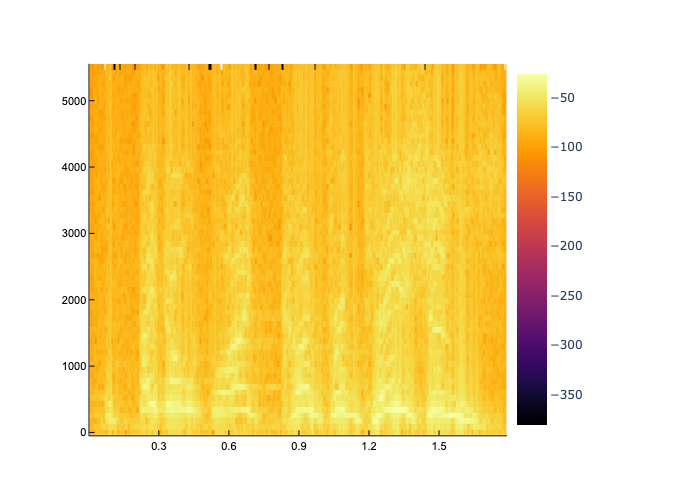

In [27]:
using DSP

include("functions.jl")
signal = confront

spectrogram(signal, 128, fs)


DSP.Periodograms.Spectrogram{Float64, Frequencies{Float32}, Matrix{Float64}}([8.718084023587962e-7 7.298997896648452e-7 1.687821066966632e-7 5.510047055008176e-7 3.191036704733784e-7 1.8519880379333047e-6 6.226679010549622e-6 1.672324672614702e-6 7.298997896648435e-7 1.6844210141974314e-6 1.6662928482308846e-6 1.8456401830036312e-6 2.35913533199296e-6 2.3092079545503733e-6 1.4395518291849024e-6 1.4227967614520737e-6 8.287628624923345e-7 2.087768620351247e-6 2.2109551476045407e-6 2.571665874080491e-6 1.5421418829324752e-6 1.6844210141974308e-6 4.001867558150092e-6 1.6783673946035465e-6 3.3783120471654813e-7 1.611973735961417e-7 5.084582759447027e-6 9.123671087575322e-6 2.416849048229113e-6 5.544755927027094e-7 2.5866609786010608e-6 3.6906319585080008e-6 1.8774884337023e-6 2.60169967354175e-6 2.1901788636158246e-6 1.224215153802282e-6 1.163014203956696e-6; 4.19099774793273e-7 3.961077730684452e-8 1.6932534789016877e-7 5.0644430055504704e-8 1.4333262381065887e-6 1.0879067880295638e-7 2.61

 9.725417824683552e-7 3.6891151280987077e-7 4.652774382504689e-6 6.078404804068428e-5 2.245062569752258e-5 5.461293780213268e-7; 8.999933543439988e-7 3.023712474878282e-6 2.0043524665873e-6 5.286849147021593e-8 1.6841522214204459e-6 3.2266185006594156e-7 5.824468021534195e-6 1.434401127166651e-6 4.1752825594459106e-7 1.8520594785445427e-7 1.0988536652314762e-6 3.728584330437449e-7 6.636194023813964e-8 6.153034175793669e-7 5.51754747316633e-7 5.551434655520671e-7 2.7432833104128574e-7 8.374218295156902e-6 1.5245001763032605e-5 2.00082450877762e-7 8.671210638743687e-7 1.0263038040397306e-7 1.3958998099326245e-6 9.40483006243594e-7 5.051164587668175e-6 2.013162415703136e-5 4.361896426930351e-6 6.226960503825192e-6 5.831423574614991e-7 2.061898437415877e-6 3.1049332533530988e-6 1.286447632599975e-6 1.757258917011759e-7 7.173502196663267e-6 0.0001277937765462772 0.00014888732406317733 1.0466411363306488e-6; 8.356744665322636e-7 2.873710792363019e-6 8.825918287612328e-7 1.4955132682686208e-6

 3.26579298806606e-5 4.938266565482115e-5 0.0001634674476613375 0.00018679083202749575 0.00020722291056305946 0.0019558591313480343 0.001190906335720853 6.562712482483996e-5 2.4975905149626e-5 2.8202500535175047e-8; 2.3052436437128406e-7 2.4316180816768474e-7 2.2991083678624927e-7 1.5224167878599794e-7 2.6826499948252856e-6 1.729555591958999e-6 4.119221765450702e-6 1.1555509902208785e-6 3.0108963912073164e-6 3.976012205593114e-6 2.1771691000245347e-5 6.477090107595003e-6 8.488724358092966e-6 1.1957432746331264e-5 2.7962584317982357e-5 2.5691991974186383e-6 2.7829151998280824e-7 3.158303837204504e-5 0.00011141592789024732 0.00027332072430247766 0.00013972876390523712 0.0004300556354342793 0.00043145608697182534 0.00022390635327070073 2.3883799852515528e-5 3.833223085510454e-5 8.35541648153945e-5 2.4690508155409254e-5 7.253591602432606e-5 5.538264323057859e-5 0.00012726740096824068 1.9915715742645224e-5 0.000630093739871103 0.00042711260127685117 1.9656855219230956e-5 2.1503326731265206e

 0.00023887681024367842 6.645085942858778e-6 2.0629595514694108e-5 4.13808248933857e-6 5.703878631476094e-9; 1.3654629639274247e-7 5.391747243536742e-7 7.72882067171143e-7 3.2881867653693516e-6 1.5035290451839045e-5 2.571434316477728e-5 0.00013645853210834968 1.712420759725855e-5 6.130281396782984e-5 3.759743236532858e-5 1.8351845677431404e-5 2.0432237459730024e-5 3.505676623362307e-5 0.00023512324206289754 0.00020048062916304393 1.003991744532973e-6 8.030524056385468e-9 7.138224210465523e-7 0.00014510847410521295 0.00047361882353084603 0.00017016986202258354 3.471756413249992e-5 0.00016770356282250353 0.00032506201166942133 3.861861699587293e-6 5.710628273695428e-7 0.00020103840570514822 0.00036413479784562096 0.0011254918496868796 0.0006486320795496377 0.00021468331029441594 3.7261570733011356e-5 6.05418105002118e-5 1.261414708671122e-5 2.2751459043261075e-5 6.7125843424386e-6 3.573130509559027e-8; 3.684750191100579e-7 1.4972607426616986e-7 8.578575207293032e-7 5.304887931566768e-6 1

 4.810570367945968e-7 4.372829418952223e-6 2.612269050729747e-6 2.5086550176906846e-6 1.1426008240934613e-6 4.411459623938739e-6 1.9796501318234803e-5 3.1356829473999253e-6 5.202884556358589e-7 3.662063955187488e-8; 3.281827062428023e-6 1.4407303846803982e-6 3.1207480522331116e-7 1.6090129748941136e-7 6.172116548591989e-6 4.042541809585669e-6 1.3596948830957551e-5 6.114104491228394e-8 9.561907331357552e-7 6.919786744656028e-7 1.3284386582228252e-7 2.56729108660657e-7 5.947506960688099e-7 5.641382492654101e-7 8.217008220906317e-8 9.540826679297775e-8 3.271240829678406e-8 4.1977851519658245e-7 2.6792823916909554e-6 3.632904099853171e-7 2.9726904963913247e-6 8.053622994730355e-7 9.287612366861099e-7 3.6459731631594993e-6 3.7467581603731605e-6 4.69551359470191e-5 4.627867546534618e-5 9.285845794860227e-7 2.9502707166618606e-6 2.4727785549002658e-6 1.3232870809491602e-6 5.608331127997193e-7 5.076460041944505e-6 1.2955744680512657e-5 5.998009906569807e-6 2.4316514756263994e-7 3.5255312941879

 6.85718545651133e-7 1.017357219990643e-5 7.628415366366593e-5 0.0001190097265217449 1.5981548241840908e-7 2.2039694623591305e-7 2.5362872259083507e-5 8.96868600203145e-6 5.230303019349576e-5 1.6869429166384281e-6 9.044685710130661e-7 1.509489911377981e-7 1.6393846721386924e-8; 1.3973314709296883e-7 1.8731101603110938e-7 2.6224090381463143e-8 8.786953915461312e-7 5.890099154493705e-7 5.699523056542505e-7 5.949497520019399e-7 2.4879705812993155e-7 8.082755565380149e-7 2.0765743713663493e-7 4.299888681936106e-6 9.135594862960755e-5 0.00015286883882613658 1.5782351670126924e-5 2.2371116747858746e-6 7.801998451296003e-8 1.121268390151254e-7 1.144314848740861e-7 0.00015011087590311996 9.782365214309438e-5 8.992863695211774e-6 1.4716100270351605e-5 5.36448842111802e-5 1.2934745913256851e-5 8.624529438340428e-7 1.0157398376107799e-5 2.518330710740121e-5 0.00010609012062005494 1.1213863143076164e-6 1.0192952464388408e-6 2.9624270427049046e-5 8.817215043603309e-5 6.423809427710587e-5 1.83292545

 8.931371130580038e-7 6.10306658589721e-7 3.47595102736955e-7 1.2812969075148243e-7 1.211523652658644e-7 1.018051899223357e-5 1.8522479350077603e-5 8.149303041766344e-5 1.5168774154060416e-5 6.358106756710244e-7 9.922935899798376e-9 3.334989682661318e-7 4.3409909709607943e-7 1.0038888452050151e-6 3.51544231669867e-7 6.294244180103871e-8 6.436601076686666e-9; 2.6966459923324482e-8 2.011585154531297e-8 1.8987883804522755e-9 7.765128195703752e-6 1.5051853788135625e-5 1.7399447407768657e-5 1.3710335458740034e-5 7.664255477206473e-6 1.0576456553967241e-5 2.8260001423857685e-6 2.4242336535703083e-9 1.0475070907107345e-7 1.3954011629401045e-6 6.637694047232692e-9 1.8933998267887096e-6 7.494029435631518e-9 9.525517671811252e-9 2.8851419548617807e-7 1.7056405650619968e-6 1.0828469689374045e-6 4.284547166399332e-7 9.028873804410398e-7 3.161251325048044e-7 8.967355346231755e-8 2.403348321826349e-7 4.281727949779085e-6 1.1485735932104495e-5 1.4902620402784514e-5 2.329745925519923e-5 7.321907302880

 4.2590805080071433e-7 3.34538754709338e-6 8.571675126810105e-6 1.8527779993927053e-7 1.2522330350811966e-7 2.022445564948335e-7 1.807617435135225e-7 1.0983639535628499e-7 6.591803852406217e-7 1.262709019233097e-6 4.073083269841161e-6 3.73436116281175e-7 7.952008802532856e-7 1.276969440962711e-7 8.742145017232755e-7 7.824962152942326e-7 5.197201776499951e-7 5.359386970507946e-7 4.265347661334763e-8 6.87289966103671e-9; 2.359216793365345e-9 3.387324243621461e-9 1.5917465563247418e-8 4.54856050633975e-7 6.45837400349324e-8 5.639542075339186e-9 2.273873490154349e-7 4.5011654685436976e-8 6.860710363509658e-9 1.1817673970274274e-8 1.3382823592774503e-6 1.0231687572735803e-7 5.776658953531594e-8 2.256105670719593e-6 3.4889699108667937e-7 4.2808350429883654e-8 5.7980451789930435e-8 4.8967692778037064e-8 8.420305427374802e-6 6.19251169392061e-6 2.3124688805914863e-7 9.080673992584589e-8 1.555132296498892e-8 1.328361026568143e-7 4.217405529198178e-8 8.316738434039132e-7 8.6417728579129e-8 3.398

 1.6171176158306958e-6 2.7331748135383637e-8 6.162983305786621e-8 5.394382472643933e-7 3.820857370853825e-6 1.0421686025713173e-5 7.06071096557313e-6 2.442339447798434e-7 3.544769063886724e-7 2.3742438815295342e-7 3.9220407618479004e-8 5.883956043628818e-6 3.761633453124895e-7 5.981255143414021e-6 1.4657399950635145e-7 4.6063418590173275e-7 1.8441916202388052e-7 1.20581522970892e-7 3.7692684338967016e-7 3.073722162800552e-7 2.957730007735482e-7 3.153578331795121e-8 1.4019585110414757e-8; 1.5606241218169404e-8 8.159481275545585e-8 8.42772388351696e-8 2.3496984249896855e-6 2.0294637824107063e-6 2.298935922886614e-6 1.947507601970944e-7 8.990551304702318e-7 2.032356553914132e-6 1.3464895619296353e-7 7.370467552681913e-8 2.1374109683083118e-7 1.2647817911839576e-6 7.399185079820269e-6 1.5028414101792007e-6 1.6392898724808272e-9 1.2206175427760526e-7 5.632271866914279e-7 2.231358671573618e-6 2.972283689636577e-6 4.300154251035426e-6 4.359789546568192e-8 3.200046562448553e-8 2.88844945705660

Excessive output truncated after 524288 bytes.

 3.507137857502034e-7 2.865713281149431e-7 1.670679936977662e-9 2.81855761678119e-8 2.645705295705173e-7 1.8760259689486805e-7 1.8763547483587509e-7 3.1531923731856155e-7 1.0200929764117072e-5 1.0004751701013609e-5 2.3589741292466444e-7 3.915628324112811e-8 3.024010925381e-7 1.0590539323674578e-6 6.848648853452304e-7 7.280091557069157e-7 1.9971904748935224e-7 1.013928105447969e-6 9.660234134389687e-7 6.476067212145418e-8 4.2665001467233883e-7 2.41988050948251e-7 9.488258666328098e-8 1.931532616085748e-9; 2.689371754476605e-8 2.0785696106337562e-8 5.933024504254742e-9 1.377133165524405e-6 5.043250946382498e-7 7.637476278830006e-7 4.3376084337229914e-5 1.859820999528288e-5 1.0960837745700713e-5 3.2060819450044795e-8 1.4087951860602666e-8 7.820830203787763e-7 7.45582791631223e-7 5.864074804532163e-7 2.0026963957183392e-7 3.422532565007009e-9 1.0773745522752107e-8 2.2589949894065744e-7 1.755340274051138e-7 5.225394392096773e-7 2.8662237014028854e-7 1.5088809571249804e-5 1.019598900822611e-

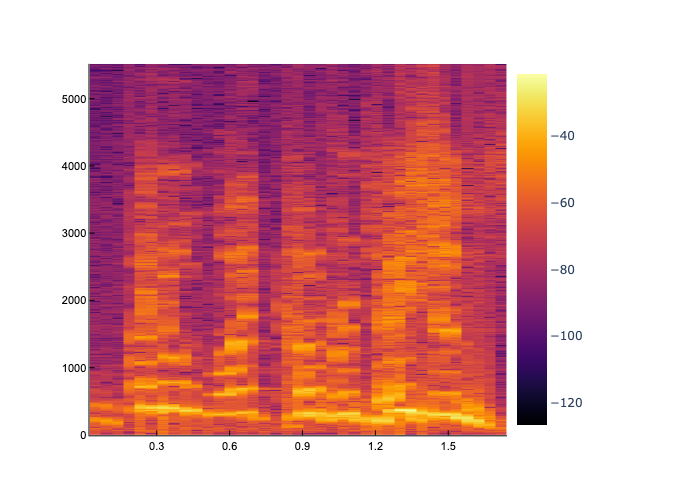

In [28]:
include("functions.jl")
signal = confront

spectrogram(signal, 1024, fs)

   b. ¿Cuál de los dos espectrogramas tiene mayor resolución en frecuencia? ¿Cuál tiene mayor resolución temporal?


De banda ancha, el primer caso, con N pequeño, se utiliza para el análisis de las formantes y tien una buena resolución temporal.
Mientras que el segundo caso, es de banda estrecha, con un tamaño de N grande, se utiliza sobre todo para el análisis del pitch, y tiene buena resolución espectral, como se aprecia en el segundo gráfico.


### Ejercicio 3: Reflexión
#### Objetivo
Es deseable que cualquier actividad que curse conlleve un aprendizaje. Este aprendizaje será más profundo y satisfactorio si usted es capaz de darse cuenta de él y enunciarlo.

#### Actividad
Escriba un párrafo listando qué conocimientos y destrezas ha adquirido en esta práctica.

En general una toma de contacto con el mundo del procesado de digital de audio.

Entendiendo todo lo relacionado con las frecuencias de los sonidos, su representación frecuencial y análisis de parámetros de interés. Así como el pitch o frecuencia central, sonidos sordos o sonoros, enventanado de señales de audio, etc.

Si que es verdad, que en esta práctica hay cosas que no se han llevado a cabo (o al menos por mi parte) de la mejor manera. Julia he encontrado poca información y cuesta entender los conceptos básicos de un tema tan interesante como este, cuando la mayor distracción es como hacer una cosa u otra con este lenguaje.

Lo que quiero decir, que gastamos mucho tiempo en aprender a utilizar esta herramienta (julia) y dedicamos el poco tiempo que nos queda a entender los conceptos básicos de este tema de audio, y eso entiendo que tamibién dificulta al aprendizaje.